In [1]:
import pandas as pd
import numpy as np
import datetime as dt
from pandas import datetime
from matplotlib import pyplot as plt
import os
import calendar
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process import kernels
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import math
from sklearn.metrics import mean_squared_error
import seaborn as sns
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import f_regression
from sklearn.metrics import r2_score

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  after removing the cwd from sys.path.


In [ ]:
for num in range(0,2):
    df_avg = pd.read_csv("halfhourly_dataset/halfhourly_dataset/block_"+str(num)+".csv")
    df_avg = df[['tstp','LCLid','energy(kWh/hh)']]
    df_avg.reset_index()
    df_avg.to_csv("hc_"+str(num)+".csv")

fout= open("energy.csv","a")
# first file:
for line in open("hc_0.csv"):
    fout.write(line)
# now the rest:    
for num in range(0,2):
    f = open("hc_"+str(num)+".csv")
    f.readline() # skip the header
    for line in f:
         fout.write(line)
    f.close()
fout.close()

In [2]:
energy = pd.read_csv('energy.csv')
np.where(pd.isna(energy['energy(kWh/hh)']))

(array([], dtype=int64),)

# Single household

In [3]:
alldata = pd.read_csv("hc_0.csv")
household = "MAC000246"

df = alldata[alldata["LCLid"] == household ]
df.reset_index(drop=True, inplace=True)
print(df.head())

   Unnamed: 0                         tstp      LCLid energy(kWh/hh)
0       24141  2011-12-03 09:00:00.0000000  MAC000246         0.149 
1       24142  2011-12-03 09:30:00.0000000  MAC000246         0.154 
2       24143  2011-12-03 10:00:00.0000000  MAC000246         0.768 
3       24144  2011-12-03 10:30:00.0000000  MAC000246         1.179 
4       24145  2011-12-03 11:00:00.0000000  MAC000246         0.588 


In [4]:
df['tstp'] = df['tstp'].astype('datetime64[s]')

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [5]:
df.loc[:,'datetime'] = pd.to_datetime(df.loc[:,'tstp'], '%Y-%m-%d %H:%M:%S')
df.loc[:,'date'] = df.loc[:,'tstp'].dt.date
df.loc[:,'month'] = df.loc[:,'datetime'].dt.month
df.loc[:,'day_of_month'] = df.loc[:,'datetime'].dt.day
df.loc[:,'time'] = df.loc[:,'datetime'].dt.time
df.loc[:,'weekday'] = df.loc[:,'datetime'].dt.weekday

C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [6]:
del df['Unnamed: 0']
df

,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday
0,2011-12-03 09:00:00,MAC000246,0.149,2011-12-03 09:00:00,2011-12-03,12,3,09:00:00,5
1,2011-12-03 09:30:00,MAC000246,0.154,2011-12-03 09:30:00,2011-12-03,12,3,09:30:00,5
2,2011-12-03 10:00:00,MAC000246,0.768,2011-12-03 10:00:00,2011-12-03,12,3,10:00:00,5
3,2011-12-03 10:30:00,MAC000246,1.179,2011-12-03 10:30:00,2011-12-03,12,3,10:30:00,5
4,2011-12-03 11:00:00,MAC000246,0.588,2011-12-03 11:00:00,2011-12-03,12,3,11:00:00,5
...,...,...,...,...,...,...,...,...,...
39240,2014-02-27 22:00:00,MAC000246,2.4360001,2014-02-27 22:00:00,2014-02-27,2,27,22:00:00,3
39241,2014-02-27 22:30:00,MAC000246,1.12,2014-02-27 22:30:00,2014-02-27,2,27,22:30:00,3
39242,2014-02-27 23:00:00,MAC000246,0.701,2014-02-27 23:00:00,2014-02-27,2,27,23:00:00,3
39243,2014-02-27 23:30:00,MAC000246,0.223,2014-02-27 23:30:00,2014-02-27,2,27,23:30:00,3


In [7]:
energy.count()

Unnamed: 0        3961205
tstp              3961205
LCLid             3961205
energy(kWh/hh)    3961205
dtype: int64

In [8]:


print('Earliest date:', df.date.min())
print('Latest date:', df.date.max())



Earliest date: 2011-12-03
Latest date: 2014-02-28


In [9]:
df = df[df["energy(kWh/hh)"] != "Null"]
df.loc[:,"energy"] = df["energy(kWh/hh)"].astype("float64")

C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [10]:
df

,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday,energy
0,2011-12-03 09:00:00,MAC000246,0.149,2011-12-03 09:00:00,2011-12-03,12,3,09:00:00,5,0.149
1,2011-12-03 09:30:00,MAC000246,0.154,2011-12-03 09:30:00,2011-12-03,12,3,09:30:00,5,0.154
2,2011-12-03 10:00:00,MAC000246,0.768,2011-12-03 10:00:00,2011-12-03,12,3,10:00:00,5,0.768
3,2011-12-03 10:30:00,MAC000246,1.179,2011-12-03 10:30:00,2011-12-03,12,3,10:30:00,5,1.179
4,2011-12-03 11:00:00,MAC000246,0.588,2011-12-03 11:00:00,2011-12-03,12,3,11:00:00,5,0.588
...,...,...,...,...,...,...,...,...,...,...
39240,2014-02-27 22:00:00,MAC000246,2.4360001,2014-02-27 22:00:00,2014-02-27,2,27,22:00:00,3,2.436
39241,2014-02-27 22:30:00,MAC000246,1.12,2014-02-27 22:30:00,2014-02-27,2,27,22:30:00,3,1.120
39242,2014-02-27 23:00:00,MAC000246,0.701,2014-02-27 23:00:00,2014-02-27,2,27,23:00:00,3,0.701
39243,2014-02-27 23:30:00,MAC000246,0.223,2014-02-27 23:30:00,2014-02-27,2,27,23:30:00,3,0.223


In [471]:
monday_df = df.loc[df['weekday'] == 0]
monday_df

,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday,energy
78,2011-12-05 00:00:00,MAC000246,0.471,2011-12-05 00:00:00,2011-12-05,12,5,00:00:00,0,0.471
79,2011-12-05 00:30:00,MAC000246,0.934,2011-12-05 00:30:00,2011-12-05,12,5,00:30:00,0,0.934
80,2011-12-05 01:00:00,MAC000246,0.326,2011-12-05 01:00:00,2011-12-05,12,5,01:00:00,0,0.326
81,2011-12-05 01:30:00,MAC000246,0.143,2011-12-05 01:30:00,2011-12-05,12,5,01:30:00,0,0.143
82,2011-12-05 02:00:00,MAC000246,0.13,2011-12-05 02:00:00,2011-12-05,12,5,02:00:00,0,0.130
...,...,...,...,...,...,...,...,...,...,...
39095,2014-02-24 21:30:00,MAC000246,1.202,2014-02-24 21:30:00,2014-02-24,2,24,21:30:00,0,1.202
39096,2014-02-24 22:00:00,MAC000246,1.363,2014-02-24 22:00:00,2014-02-24,2,24,22:00:00,0,1.363
39097,2014-02-24 22:30:00,MAC000246,0.942,2014-02-24 22:30:00,2014-02-24,2,24,22:30:00,0,0.942
39098,2014-02-24 23:00:00,MAC000246,0.298,2014-02-24 23:00:00,2014-02-24,2,24,23:00:00,0,0.298


In [523]:
# FOR LATER USE
tuesday_df = df.loc[df['weekday'] == 1]
tuesday_df.loc[:,'time'] = tuesday_df.loc[:,'datetime'].dt.time
tuesday_df.loc[:,'hour'] = tuesday_df.loc[:,'datetime'].dt.hour
tuesday_df.loc[:,'minute'] = tuesday_df.loc[:,'datetime'].dt.minute
wednesday_df = df.loc[df['weekday'] == 2]
thursday_df = df.loc[df['weekday'] == 3]
friday_df = df.loc[df['weekday'] == 4]
saturday_df = df.loc[df['weekday'] == 5]
sunday_df = df.loc[df['weekday'] == 6]

C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


# Weather info

In [524]:
weather = pd.read_csv('weather_hourly_darksky.csv')
weather.head(4)

,visibility,windBearing,temperature,time,dewPoint,pressure,apparentTemperature,windSpeed,precipType,icon,humidity,summary
0,5.97,104,10.24,2011-11-11 00:00:00,8.86,1016.76,10.24,2.77,rain,partly-cloudy-night,0.91,Partly Cloudy
1,4.88,99,9.76,2011-11-11 01:00:00,8.83,1016.63,8.24,2.95,rain,partly-cloudy-night,0.94,Partly Cloudy
2,3.70,98,9.46,2011-11-11 02:00:00,8.79,1016.36,7.76,3.17,rain,partly-cloudy-night,0.96,Partly Cloudy
3,3.12,99,9.23,2011-11-11 03:00:00,8.63,1016.28,7.44,3.25,rain,fog,0.96,Foggy


In [525]:
weather.describe()

,visibility,windBearing,temperature,dewPoint,pressure,apparentTemperature,windSpeed,humidity
count,21165.000000,21165.000000,21165.000000,21165.000000,21152.000000,21165.000000,21165.000000,21165.000000
mean,11.166485,195.685897,10.471486,6.530501,1014.125153,9.230338,3.905215,0.781829
std,3.099337,90.629453,5.781904,5.041965,11.388337,6.940919,2.026854,0.140369
min,0.180000,0.000000,-5.640000,-9.980000,975.740000,-8.880000,0.040000,0.230000
25%,10.120000,121.000000,6.470000,2.820000,1007.430000,3.900000,2.420000,0.700000
50%,12.260000,217.000000,9.930000,6.570000,1014.780000,9.360000,3.680000,0.810000
75%,13.080000,256.000000,14.310000,10.330000,1022.050000,14.320000,5.070000,0.890000
max,16.090000,359.000000,32.400000,19.880000,1043.320000,32.420000,14.800000,1.000000


In [526]:
pd.to_datetime(weather['time'])
weather = weather[['temperature', 'windBearing', 'dewPoint', 'windSpeed',
       'pressure', 'visibility', 'humidity', 'apparentTemperature','time']]
weather.rename(columns = {'time':'tstp'}, inplace = True)
weather = weather.dropna()
weather

,temperature,windBearing,dewPoint,windSpeed,pressure,visibility,humidity,apparentTemperature,tstp
0,10.24,104,8.86,2.77,1016.76,5.97,0.91,10.24,2011-11-11 00:00:00
1,9.76,99,8.83,2.95,1016.63,4.88,0.94,8.24,2011-11-11 01:00:00
2,9.46,98,8.79,3.17,1016.36,3.70,0.96,7.76,2011-11-11 02:00:00
3,9.23,99,8.63,3.25,1016.28,3.12,0.96,7.44,2011-11-11 03:00:00
4,9.26,111,9.21,3.70,1015.98,1.85,1.00,7.24,2011-11-11 04:00:00
...,...,...,...,...,...,...,...,...,...
21160,7.39,247,3.06,6.08,997.07,12.68,0.74,3.91,2014-02-15 19:00:00
21161,6.56,249,2.76,5.61,998.15,13.78,0.77,3.03,2014-02-15 20:00:00
21162,6.47,248,2.71,5.25,999.28,14.31,0.77,3.06,2014-02-15 21:00:00
21163,5.96,248,2.69,4.69,1000.33,14.31,0.80,2.68,2014-02-15 22:00:00


In [527]:
pd.to_datetime(weather['tstp'])
weather['tstp'] = weather['tstp'].astype('datetime64[s]')

In [528]:
weather.loc[:,'datetime'] = pd.to_datetime(weather.loc[:,'tstp'], '%Y-%m-%d %H:%M:%S')
weather.loc[:,'date'] = weather.loc[:,'tstp'].dt.date
weather.loc[:,'time'] = weather.loc[:,'datetime'].dt.time
weather.loc[:,'hour'] = weather.loc[:,'datetime'].dt.hour
weather.loc[:,'minute'] = weather.loc[:,'datetime'].dt.minute
weather.sort_values(by = ['date','time'])
del weather['date']
del weather['time']
del weather['datetime']

# Merge with single household data

In [529]:
weather_energy = wednesday_df.merge(weather,on='tstp')
weather_energy

,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday,energy,temperature,windBearing,dewPoint,windSpeed,pressure,visibility,humidity,apparentTemperature,hour,minute
0,2011-12-07 00:00:00,MAC000246,0.735,2011-12-07 00:00:00,2011-12-07,12,7,00:00:00,2,0.735,6.63,236,4.53,5.49,1005.27,14.13,0.86,3.17,0,0
1,2011-12-07 01:00:00,MAC000246,0.41,2011-12-07 01:00:00,2011-12-07,12,7,01:00:00,2,0.410,7.67,236,5.41,5.84,1004.20,13.49,0.86,4.33,1,0
2,2011-12-07 02:00:00,MAC000246,0.432,2011-12-07 02:00:00,2011-12-07,12,7,02:00:00,2,0.432,7.76,239,5.46,6.53,1003.06,13.50,0.85,4.21,2,0
3,2011-12-07 03:00:00,MAC000246,0.077,2011-12-07 03:00:00,2011-12-07,12,7,03:00:00,2,0.077,8.26,244,5.88,7.16,1002.31,13.16,0.85,4.66,3,0
4,2011-12-07 04:00:00,MAC000246,0.05,2011-12-07 04:00:00,2011-12-07,12,7,04:00:00,2,0.050,8.61,250,5.71,7.06,1001.93,13.05,0.82,5.14,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,2014-02-26 19:00:00,MAC000246,0.157,2014-02-26 19:00:00,2014-02-26,2,26,19:00:00,2,0.157,7.73,215,2.23,3.85,1016.35,16.09,0.68,5.29,19,0
2804,2014-02-26 20:00:00,MAC000246,0.174,2014-02-26 20:00:00,2014-02-26,2,26,20:00:00,2,0.174,7.06,206,2.38,3.49,1016.24,16.09,0.72,4.67,20,0
2805,2014-02-26 21:00:00,MAC000246,0.45,2014-02-26 21:00:00,2014-02-26,2,26,21:00:00,2,0.450,6.58,206,2.75,3.97,1016.02,15.84,0.77,3.82,21,0
2806,2014-02-26 22:00:00,MAC000246,1.158,2014-02-26 22:00:00,2014-02-26,2,26,22:00:00,2,1.158,6.24,207,3.11,3.74,1015.85,12.96,0.80,3.53,22,0


# # Merge with averaged energy

In [ ]:
weather_energy =  energy.merge(weather,on='tstp')
weather_energy

In [530]:
weather_energy.head(2)

,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday,energy,temperature,windBearing,dewPoint,windSpeed,pressure,visibility,humidity,apparentTemperature,hour,minute
0,2011-12-07 00:00:00,MAC000246,0.735,2011-12-07 00:00:00,2011-12-07,12,7,00:00:00,2,0.735,6.63,236,4.53,5.49,1005.27,14.13,0.86,3.17,0,0
1,2011-12-07 01:00:00,MAC000246,0.41,2011-12-07 01:00:00,2011-12-07,12,7,01:00:00,2,0.410,7.67,236,5.41,5.84,1004.20,13.49,0.86,4.33,1,0


In [531]:
weather_energy.rename(columns = {'energy(kWh/hh)':'en_consum'}, inplace = True)

In [532]:
del weather_energy['en_consum']

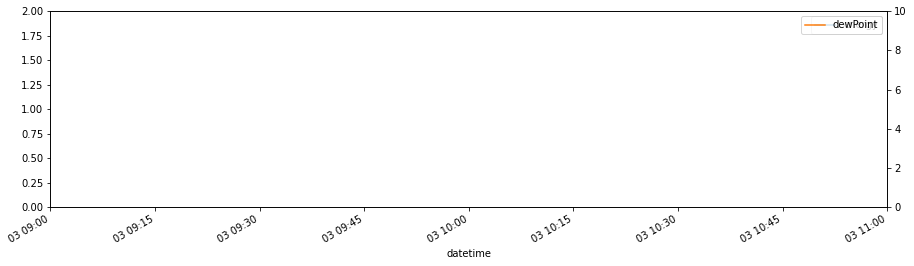

In [533]:
#FOR LATER USE!
fig, axes = plt.subplots(nrows=1, ncols=1)
weather_energy.plot(x = "datetime",y="energy", figsize=(15, 4),ylim = (0,2), xlim=('2011-12-03 09:00:00', '2011-12-03 11:00:00'), ax = axes)
axes = axes.twinx()
weather_energy.plot(x = "datetime",y=["dewPoint"], figsize=(15, 4),ylim = (0,10), xlim=('2011-12-03 09:00:00', '2011-12-03 11:00:00'), color = 'tab:orange', ax = axes)
plt.show()

In [534]:
weather_energy.dtypes

tstp                   datetime64[ns]
LCLid                          object
datetime               datetime64[ns]
date                           object
month                           int64
day_of_month                    int64
time                           object
weekday                         int64
energy                        float64
temperature                   float64
windBearing                     int64
dewPoint                      float64
windSpeed                     float64
pressure                      float64
visibility                    float64
humidity                      float64
apparentTemperature           float64
hour                            int64
minute                          int64
dtype: object

In [535]:
cor_matrix = weather_energy[['energy','temperature', 'windBearing', 'dewPoint', 'windSpeed',
       'pressure', 'visibility', 'humidity']].corr()
cor_matrix

,energy,temperature,windBearing,dewPoint,windSpeed,pressure,visibility,humidity
energy,1.000000,-0.157073,-0.001960,-0.111297,-0.040320,-0.025715,0.004600,0.103620
temperature,-0.157073,1.000000,0.061423,0.858416,-0.055175,0.043564,0.247949,-0.419931
windBearing,-0.001960,0.061423,1.000000,0.106085,0.124274,-0.063019,0.224002,0.046195
dewPoint,-0.111297,0.858416,0.106085,1.000000,-0.099860,-0.061065,0.004437,0.097696
windSpeed,-0.040320,-0.055175,0.124274,-0.099860,1.000000,-0.367538,0.235944,-0.112388
pressure,-0.025715,0.043564,-0.063019,-0.061065,-0.367538,1.000000,-0.015248,-0.181785
visibility,0.004600,0.247949,0.224002,0.004437,0.235944,-0.015248,1.000000,-0.519417
humidity,0.103620,-0.419931,0.046195,0.097696,-0.112388,-0.181785,-0.519417,1.000000


# Bank holidays

In [536]:
holiday = pd.read_csv('uk_bank_holidays.csv')
holiday['Bank holidays'] = pd.to_datetime(holiday['Bank holidays']).dt.date
holiday.head(4)

,Bank holidays,Type
0,2012-12-26,Boxing Day
1,2012-12-25,Christmas Day
2,2012-08-27,Summer bank holiday
3,2012-05-06,Queen?s Diamond Jubilee (extra bank holiday)


In [537]:
weather_energy = weather_energy.merge(holiday, left_on = 'date',right_on = 'Bank holidays', how = 'left')
weather_energy['holiday_ind'] = np.where(weather_energy['Bank holidays'].isna(),0,1)

In [538]:
weather_energy

,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,temperature,...,windSpeed,pressure,visibility,humidity,apparentTemperature,hour,minute,Bank holidays,Type,holiday_ind
0,2011-12-07 00:00:00,MAC000246,2011-12-07 00:00:00,2011-12-07,12,7,00:00:00,2,0.735,6.63,...,5.49,1005.27,14.13,0.86,3.17,0,0,NaN,NaN,0
1,2011-12-07 01:00:00,MAC000246,2011-12-07 01:00:00,2011-12-07,12,7,01:00:00,2,0.410,7.67,...,5.84,1004.20,13.49,0.86,4.33,1,0,NaN,NaN,0
2,2011-12-07 02:00:00,MAC000246,2011-12-07 02:00:00,2011-12-07,12,7,02:00:00,2,0.432,7.76,...,6.53,1003.06,13.50,0.85,4.21,2,0,NaN,NaN,0
3,2011-12-07 03:00:00,MAC000246,2011-12-07 03:00:00,2011-12-07,12,7,03:00:00,2,0.077,8.26,...,7.16,1002.31,13.16,0.85,4.66,3,0,NaN,NaN,0
4,2011-12-07 04:00:00,MAC000246,2011-12-07 04:00:00,2011-12-07,12,7,04:00:00,2,0.050,8.61,...,7.06,1001.93,13.05,0.82,5.14,4,0,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,2014-02-26 19:00:00,MAC000246,2014-02-26 19:00:00,2014-02-26,2,26,19:00:00,2,0.157,7.73,...,3.85,1016.35,16.09,0.68,5.29,19,0,NaN,NaN,0
2804,2014-02-26 20:00:00,MAC000246,2014-02-26 20:00:00,2014-02-26,2,26,20:00:00,2,0.174,7.06,...,3.49,1016.24,16.09,0.72,4.67,20,0,NaN,NaN,0
2805,2014-02-26 21:00:00,MAC000246,2014-02-26 21:00:00,2014-02-26,2,26,21:00:00,2,0.450,6.58,...,3.97,1016.02,15.84,0.77,3.82,21,0,NaN,NaN,0
2806,2014-02-26 22:00:00,MAC000246,2014-02-26 22:00:00,2014-02-26,2,26,22:00:00,2,1.158,6.24,...,3.74,1015.85,12.96,0.80,3.53,22,0,NaN,NaN,0


# ACORN data

In [539]:
house_info = pd.read_csv('informations_households.csv')

In [540]:
house_info

,LCLid,stdorToU,Acorn,Acorn_grouped,file
0,MAC005492,ToU,ACORN-,ACORN-,block_0
1,MAC001074,ToU,ACORN-,ACORN-,block_0
2,MAC000002,Std,ACORN-A,Affluent,block_0
3,MAC003613,Std,ACORN-A,Affluent,block_0
4,MAC003597,Std,ACORN-A,Affluent,block_0
...,...,...,...,...,...
5561,MAC002056,Std,ACORN-U,ACORN-U,block_111
5562,MAC004587,Std,ACORN-U,ACORN-U,block_111
5563,MAC004828,Std,ACORN-U,ACORN-U,block_111
5564,MAC001704,ToU,ACORN-U,ACORN-U,block_111


In [541]:
LCLids_del = house_info.loc[house_info.Acorn == 'ACORN-'].LCLid.values
LCLids_del

array(['MAC005492', 'MAC001074'], dtype=object)

In [542]:
#Delete these houses from the current block being analysed
for i in range (0,len(LCLids_del)): 
    if any(weather_energy.LCLid == LCLids_del[i]):
        weather_energy = weather_energy.loc [weather_energy.LCLid != LCLids_del[i]]
        print(i)

In [553]:
weather_energy_info = weather_energy.merge(house_info, on = 'LCLid')

In [554]:
del weather_energy_info['file']

# Visualization

In [555]:
def get_season(date):
    Y = date.year 
    seasons = [('winter', (dt.date(Y,  1,  1),  dt.date(Y,  3, 20))),
               ('spring', (dt.date(Y,  3, 21),  dt.date(Y,  6, 20))),
               ('summer', (dt.date(Y,  6, 21),  dt.date(Y,  9, 22))),
               ('autumn', (dt.date(Y,  9, 23),  dt.date(Y, 12, 20))),
               ('winter', (dt.date(Y, 12, 21),  dt.date(Y, 12, 31)))]
    return next(season for season, (start, end) in seasons
                if start <= date <= end)


def get_day_part(hourofd):
    day_times = [('night',(0,6)), ('morning', (6,10)), ('noon', (10,14)), 
                 ('afternoon',(14,18)), ('evening', (18,22)), ('night',(22,24))]
    return next(day_time for day_time, (start, end) in day_times
                if start <= hourofd < end)
def calculate_dayofy(datetimes):
    days = datetimes.day.values 
    months = datetimes.month.values 
    years = datetimes.year.values
    dayofy = np.zeros(days.shape)
    for i in range(len(days)):
        diff = dt.date(years[i], months[i], days[i]) - dt.date(years[i], 1, 1)
        dayofy[i] = diff.days
    return dayofy

In [556]:
weather_energy_info['weekday'] = weather_energy_info.loc[:,'tstp'].dt.day_name()
weather_energy_info['flag_weekend'] = weather_energy_info.loc[:,'weekday'].replace(['Saturday', 'Sunday'], True).replace(['Monday','Tuesday','Wednesday','Thursday','Friday'],False)
weather_energy_info['dayofy'] = calculate_dayofy(weather_energy_info.loc[:,'tstp'].dt)
weather_energy_info['dayofy_x'] = np.sin(weather_energy_info['dayofy']/365*2*math.pi)
weather_energy_info['dayofy_y'] = np.cos(weather_energy_info['dayofy']/365*2*math.pi)
weather_energy['dayofy'] = calculate_dayofy(weather_energy.loc[:,'tstp'].dt)
weather_energy['dayofy_x'] = np.sin(weather_energy['dayofy']/365*2*math.pi)
weather_energy['dayofy_y'] = np.cos(weather_energy['dayofy']/365*2*math.pi)
weather_energy_info['time'] = weather_energy_info['hour'] + weather_energy_info['minute']/60
# time of day
weather_energy_info['daypart'] = [get_day_part(h) for h in weather_energy_info.time] 
# month
weather_energy_info['month'] = weather_energy_info.loc[:,'tstp'].dt.month
# season
weather_energy_info['season'] = [get_season(date) for date in weather_energy_info.date]

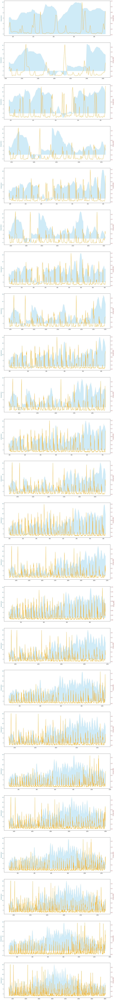

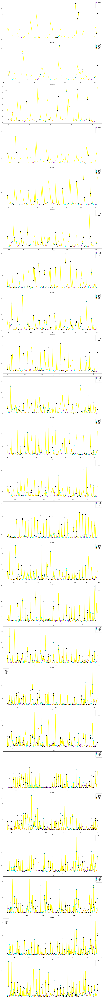

In [496]:
# plot consumption over different months
ind1 = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2012), side='left')
ind2 = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2013), side='left')
# colors
color_dict = {
  "weekday": "blue",
  "weekend": "red",
  "holiday": "green"
}
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "teal",
  "night":"black"
}
fig, axs = plt.subplots(24, 1, figsize=(20,24*8))
fff, xxx = plt.subplots(24, 1, figsize=(20,24*8))

for i in np.arange(1,13):
    if not i==12:
        ind1_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=i+1,year=2012), side='left')
    else:
        ind1_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2013), side='left')
    df_temp = weather_energy_info.iloc[np.arange(ind1,ind1_next),:]
    # temperature
    ax1 = axs[2*(i-1)]
    color = 'tab:blue'
    ax1.set_ylabel('temperature', color=color) 
    ax1.fill_between(df_temp.index, np.array(df_temp.temperature.values, dtype=float),
                 color="skyblue", alpha=0.4)
    ax1.tick_params(axis='y', labelcolor=color)
    # energy
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_xlabel('Sample Number')
    ax2.set_ylabel('Energy [KW]', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='orange')
    # energy color by time
    xxx[2*(i-1)].plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='yellow')
    groups = df_temp.groupby('daypart')
    for name, group in groups:
        xxx[2*(i-1)].plot(group.index, group.energy, marker='o', linestyle='', ms=4, label=name, c=color_dict_dp[name])
    xxx[2*(i-1)].legend()
    xxx[2*(i-1)].set_title(weather_energy_info.date.iloc[ind1].strftime("%B") + '2012')
    
    
    
    # 2013
    if not i==12:
        ind2_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=i+1,year=2013), side='left')
        df_temp = weather_energy_info.iloc[ind2:ind2_next,:]
    else:   
        df_temp = weather_energy_info.iloc[ind2:,:]
    # temperature
    ax1 = axs[2*i-1]
    color = 'tab:blue'
    ax1.set_ylabel('temperature', color=color)  
    ax1.fill_between(df_temp.index, np.array(df_temp.temperature.values, dtype=float),
                 color="skyblue", alpha=0.4)
    ax1.tick_params(axis='y', labelcolor=color)
    # energy
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_xlabel('Sample Number')
    ax2.set_ylabel('Energy [KW]', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    # connect all with narrow line
    ax2.plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='orange')
    # energy color by time
    xxx[2*i-1].plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='yellow')
    groups = df_temp.groupby('daypart')
    for name, group in groups:
        xxx[2*i-1].plot(group.index, group.energy, marker='o', linestyle='', ms=4, label=name, c=color_dict_dp[name])
    xxx[2*i-1].legend()
    xxx[2*i-1].set_title(weather_energy_info.date.iloc[ind1].strftime("%B") + '2013')
    
plt.tight_layout()
plt.show()

## Box plots

In [497]:
weather_energy_info

,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,temperature,...,holiday_ind,stdorToU,Acorn,Acorn_grouped,flag_weekend,dayofy,dayofy_x,dayofy_y,daypart,season
0,2011-12-07 00:00:00,MAC000246,2011-12-07 00:00:00,2011-12-07,12,7,0.0,Wednesday,0.735,6.63,...,0,Std,ACORN-A,Affluent,False,340.0,-0.417194,0.908818,night,autumn
1,2011-12-07 01:00:00,MAC000246,2011-12-07 01:00:00,2011-12-07,12,7,1.0,Wednesday,0.410,7.67,...,0,Std,ACORN-A,Affluent,False,340.0,-0.417194,0.908818,night,autumn
2,2011-12-07 02:00:00,MAC000246,2011-12-07 02:00:00,2011-12-07,12,7,2.0,Wednesday,0.432,7.76,...,0,Std,ACORN-A,Affluent,False,340.0,-0.417194,0.908818,night,autumn
3,2011-12-07 03:00:00,MAC000246,2011-12-07 03:00:00,2011-12-07,12,7,3.0,Wednesday,0.077,8.26,...,0,Std,ACORN-A,Affluent,False,340.0,-0.417194,0.908818,night,autumn
4,2011-12-07 04:00:00,MAC000246,2011-12-07 04:00:00,2011-12-07,12,7,4.0,Wednesday,0.050,8.61,...,0,Std,ACORN-A,Affluent,False,340.0,-0.417194,0.908818,night,autumn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,2014-02-26 19:00:00,MAC000246,2014-02-26 19:00:00,2014-02-26,2,26,19.0,Wednesday,0.157,7.73,...,0,Std,ACORN-A,Affluent,False,56.0,0.821477,0.570242,evening,winter
2804,2014-02-26 20:00:00,MAC000246,2014-02-26 20:00:00,2014-02-26,2,26,20.0,Wednesday,0.174,7.06,...,0,Std,ACORN-A,Affluent,False,56.0,0.821477,0.570242,evening,winter
2805,2014-02-26 21:00:00,MAC000246,2014-02-26 21:00:00,2014-02-26,2,26,21.0,Wednesday,0.450,6.58,...,0,Std,ACORN-A,Affluent,False,56.0,0.821477,0.570242,evening,winter
2806,2014-02-26 22:00:00,MAC000246,2014-02-26 22:00:00,2014-02-26,2,26,22.0,Wednesday,1.158,6.24,...,0,Std,ACORN-A,Affluent,False,56.0,0.821477,0.570242,night,winter


Text(0.5, 1.0, 'Day Parts Box Plot')

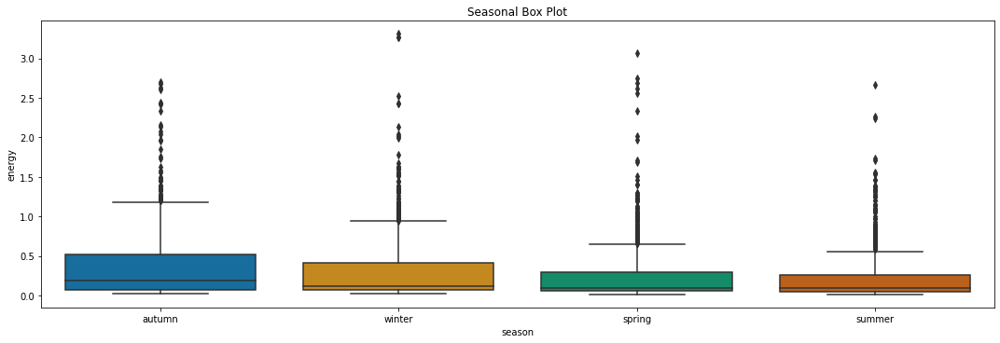

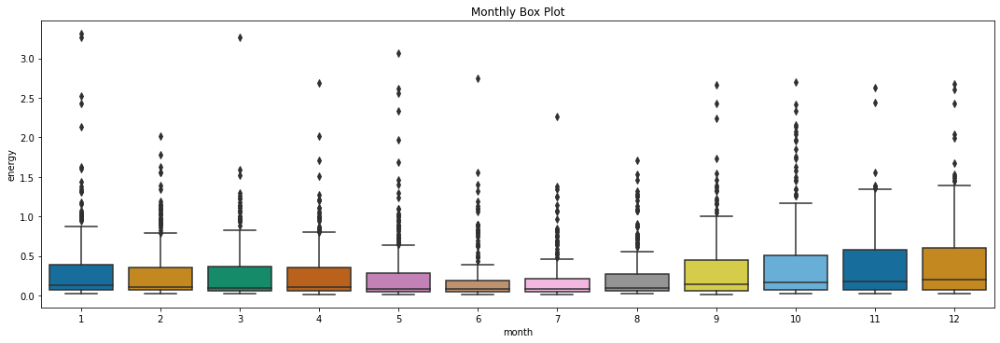

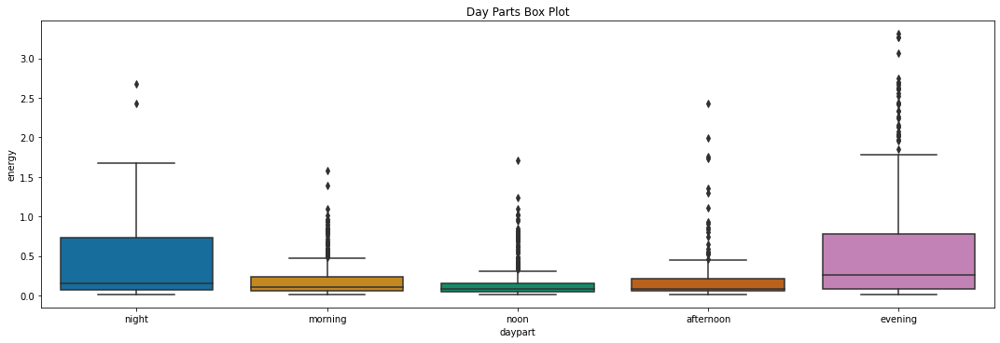

In [498]:
######


fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='season', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Seasonal Box Plot')

fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='month', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Monthly Box Plot')

fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='daypart', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Day Parts Box Plot')



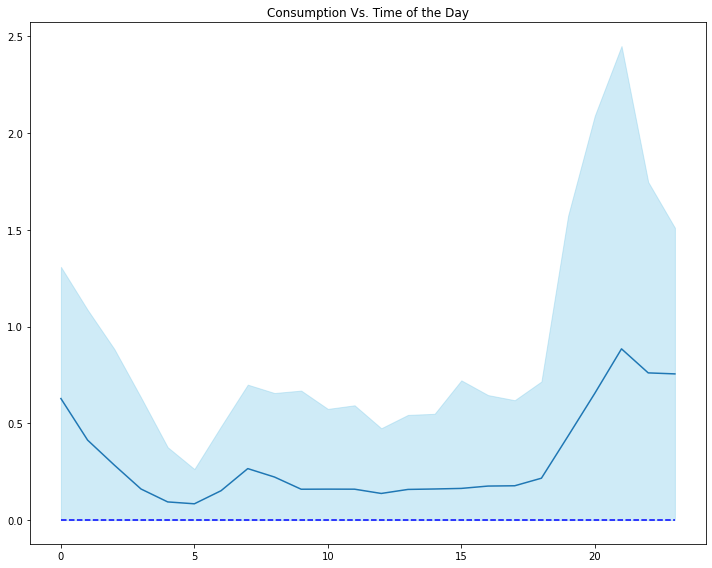

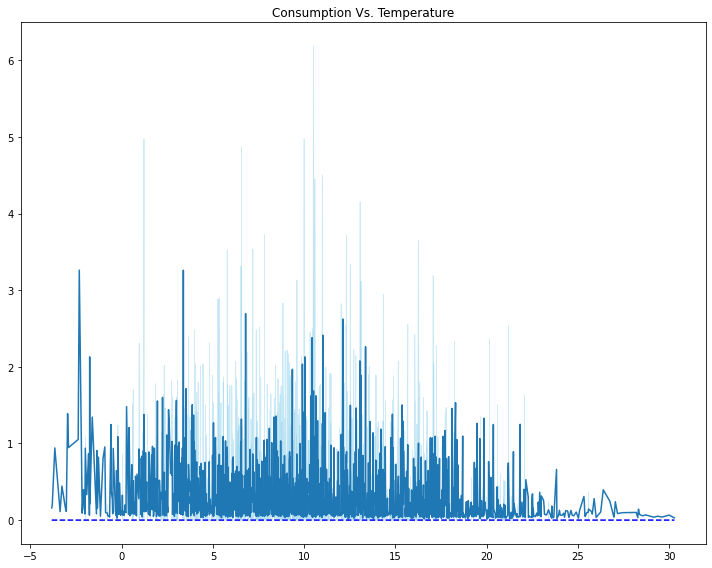

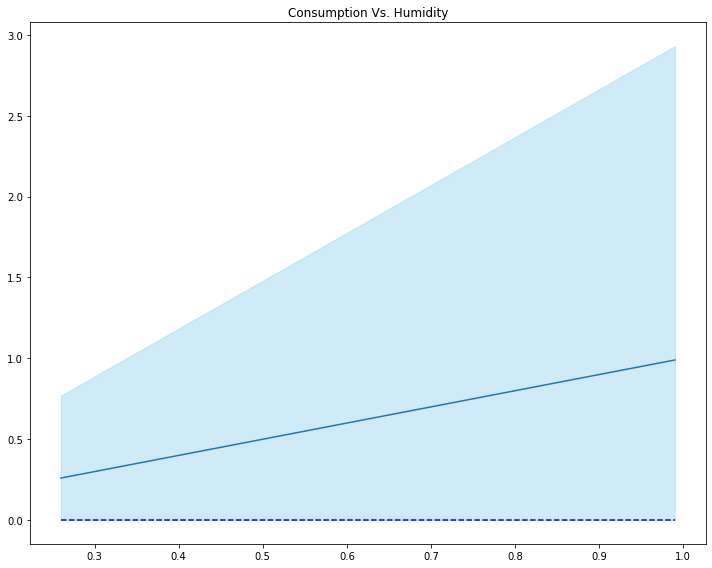

In [499]:
fig, ax = plt.subplots(1,1,figsize=(10,8))
hours = np.arange(0,24,1)
horiz_line_data = np.zeros(24)

de_temp = weather_energy_info.copy()
means = de_temp.groupby('hour', as_index=False)['energy'].mean()
means = np.array(means.energy.values, dtype=float)
stds = de_temp.groupby('hour', as_index=False)['energy'].std()
stds = np.array(stds.energy.values, dtype=float)
# plot mean
ax.plot(hours, means)
# cnof bound
ax.fill_between(hours, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(hours, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Time of the Day')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()

# temperature
fig, ax = plt.subplots(1,1,figsize=(10,8))
de_temp = weather_energy_info.copy()
means = de_temp.groupby('temperature', as_index=False)['energy'].mean()
temps = means.temperature.unique()
temps.sort()
horiz_line_data = np.zeros(len(temps))
means = np.array(means.energy.values, dtype=float)
stds = de_temp.groupby('temperature', as_index=False)['energy'].std()
stds = np.array(stds.energy.values, dtype=float)

# plot mean
ax.plot(temps, means)
# cnof bound
ax.fill_between(temps, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(temps, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Temperature')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()

# humidity
fig, ax = plt.subplots(1,1,figsize=(10,8))
de_temp = weather_energy_info.copy()
means = de_temp.groupby('humidity', as_index=False)['energy'].mean()
temps = means.humidity.unique()
temps.sort()
horiz_line_data = np.zeros(len(temps))
means = np.array(means.humidity.values, dtype=float)
stds = de_temp.groupby('humidity', as_index=False)['energy'].std()
stds = np.array(stds.humidity.values, dtype=float)

# plot mean
ax.plot(temps, means)
# cnof bound
ax.fill_between(temps, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(temps, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Humidity')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()


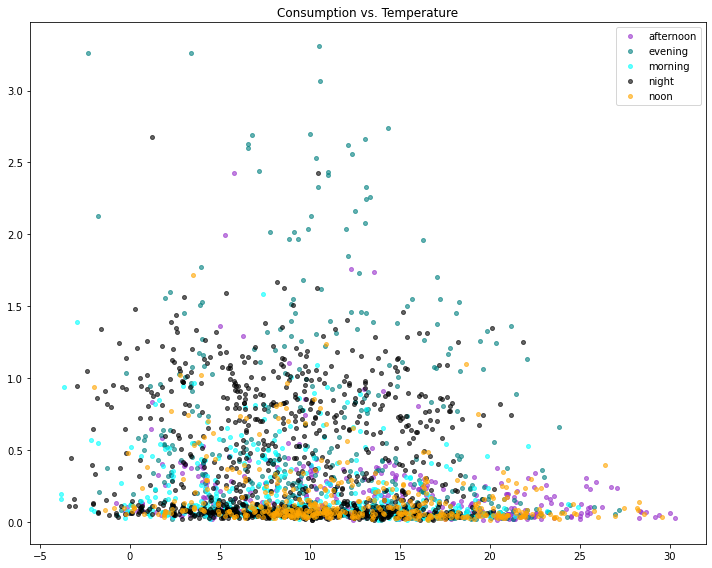

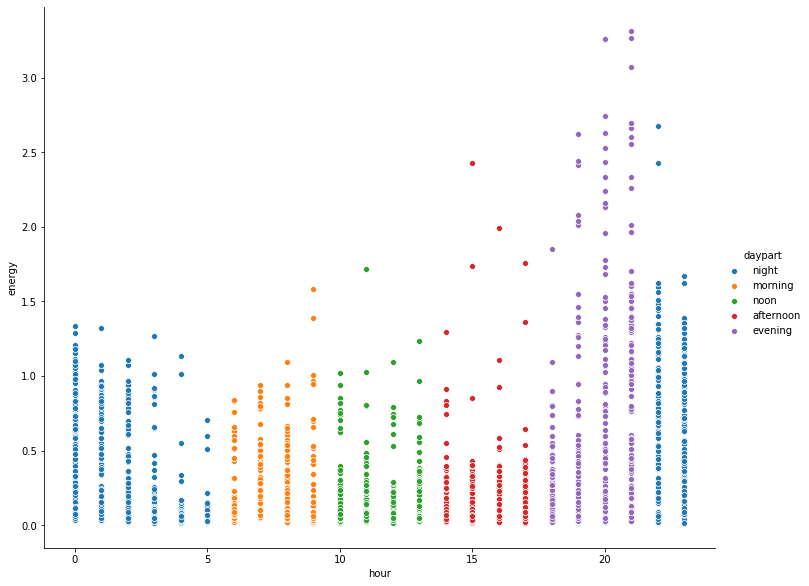

In [500]:
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "teal",
  "night":"black"
}
groups = weather_energy_info.groupby('daypart')
fig, ax = plt.subplots(figsize=(10,8))
for name, group in groups:
    ax.plot(group.temperature, group.energy, marker='o', 
            linestyle='', ms=4, label=name, c=color_dict_dp[name],alpha=0.6)
    ax.legend()
    ax.set_title('Consumption vs. Temperature')
               
plt.tight_layout()
plt.show()



pp = sns.pairplot(weather_energy_info[['energy', 'hour','daypart']],
                  x_vars=['hour'], y_vars=['energy'],
                  height=8, aspect=1.25, hue = "daypart")

#fig = pp.fig() 

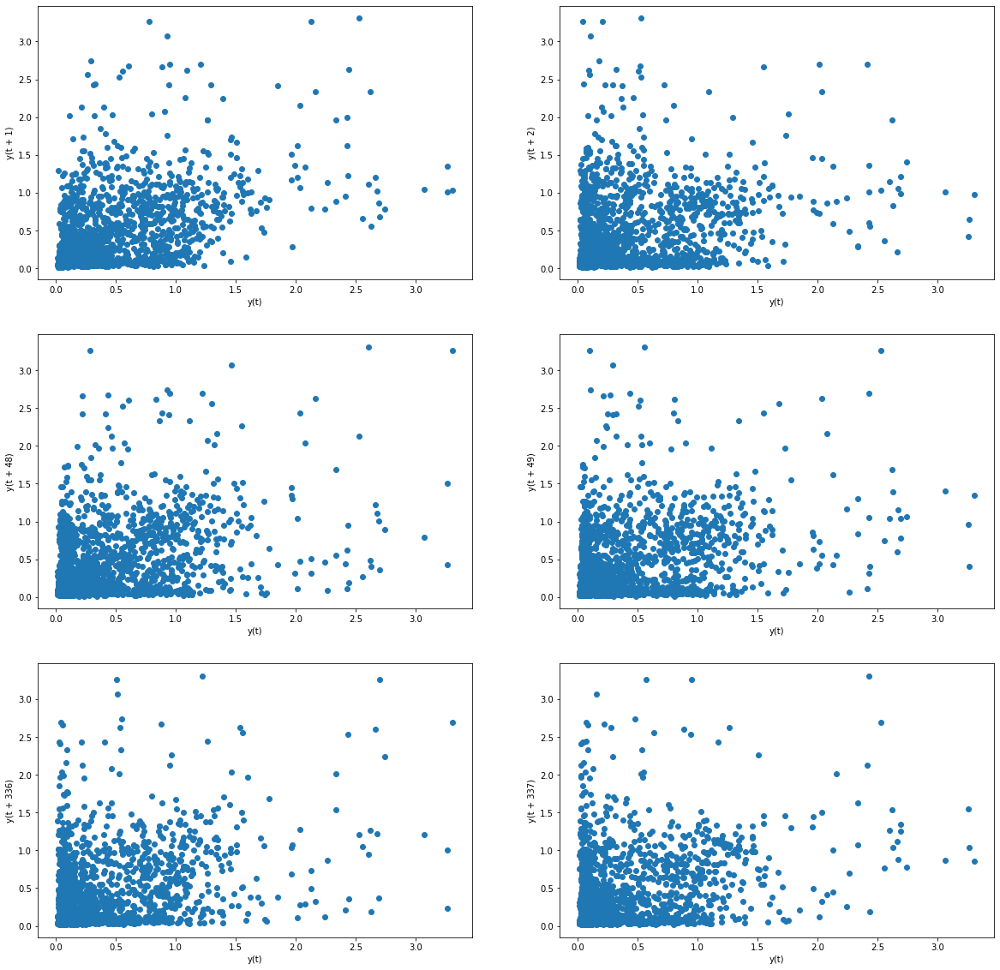

In [501]:
lags = [1, 2, 48, 49, 48*7, 48*7+1]
fig, axs = plt.subplots(math.ceil(len(lags)/2), 2, figsize=(20,20))
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "teal",
  "night":"black"
}
for i, lag in enumerate(lags):
    #colors = [color_dict_dp[j] for j in df_1p.daypart.iloc[0:35089-lag]]
    pd.plotting.lag_plot(weather_energy_info.energy, lag=lag, ax=axs[int(i/2), int(i%2)])
    


# Cutting Outliers

In [387]:
Q1 = weather_energy_info['energy'].quantile(0.25)
Q3 = weather_energy_info['energy'].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (weather_energy_info['energy'] >= Q1 - 1.5 * IQR) & (weather_energy_info['energy'] <= Q3 + 1.5 *IQR)
print(filter)
weather_energy_info = weather_energy_info.loc[filter]  

datetime
2011-12-05 00:00:00     True
2011-12-05 01:00:00     True
2011-12-05 02:00:00     True
2011-12-05 03:00:00     True
2011-12-05 04:00:00     True
                       ...  
2014-02-24 19:00:00     True
2014-02-24 20:00:00    False
2014-02-24 21:00:00    False
2014-02-24 22:00:00    False
2014-02-24 23:00:00     True
Name: energy, Length: 2803, dtype: bool


In [388]:
Q1 = weather_energy['energy'].quantile(0.25)
Q3 = weather_energy['energy'].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (weather_energy['energy'] >= Q1 - 1.5 * IQR) & (weather_energy['energy'] <= Q3 + 1.5 *IQR)
print(filter)
deleted_feat = weather_energy.loc[~filter]
weather_energy = weather_energy.loc[filter]  


0        True
1        True
2        True
3        True
4        True
        ...  
2798     True
2799    False
2800    False
2801    False
2802     True
Name: energy, Length: 2803, dtype: bool


In [393]:
weather_energy.reset_index(inplace = True)

In [545]:
weather_energy

,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,temperature,...,windSpeed,pressure,visibility,humidity,apparentTemperature,hour,minute,Bank holidays,Type,holiday_ind
0,2011-12-07 00:00:00,MAC000246,2011-12-07 00:00:00,2011-12-07,12,7,00:00:00,2,0.735,6.63,...,5.49,1005.27,14.13,0.86,3.17,0,0,NaN,NaN,0
1,2011-12-07 01:00:00,MAC000246,2011-12-07 01:00:00,2011-12-07,12,7,01:00:00,2,0.410,7.67,...,5.84,1004.20,13.49,0.86,4.33,1,0,NaN,NaN,0
2,2011-12-07 02:00:00,MAC000246,2011-12-07 02:00:00,2011-12-07,12,7,02:00:00,2,0.432,7.76,...,6.53,1003.06,13.50,0.85,4.21,2,0,NaN,NaN,0
3,2011-12-07 03:00:00,MAC000246,2011-12-07 03:00:00,2011-12-07,12,7,03:00:00,2,0.077,8.26,...,7.16,1002.31,13.16,0.85,4.66,3,0,NaN,NaN,0
4,2011-12-07 04:00:00,MAC000246,2011-12-07 04:00:00,2011-12-07,12,7,04:00:00,2,0.050,8.61,...,7.06,1001.93,13.05,0.82,5.14,4,0,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,2014-02-26 19:00:00,MAC000246,2014-02-26 19:00:00,2014-02-26,2,26,19:00:00,2,0.157,7.73,...,3.85,1016.35,16.09,0.68,5.29,19,0,NaN,NaN,0
2804,2014-02-26 20:00:00,MAC000246,2014-02-26 20:00:00,2014-02-26,2,26,20:00:00,2,0.174,7.06,...,3.49,1016.24,16.09,0.72,4.67,20,0,NaN,NaN,0
2805,2014-02-26 21:00:00,MAC000246,2014-02-26 21:00:00,2014-02-26,2,26,21:00:00,2,0.450,6.58,...,3.97,1016.02,15.84,0.77,3.82,21,0,NaN,NaN,0
2806,2014-02-26 22:00:00,MAC000246,2014-02-26 22:00:00,2014-02-26,2,26,22:00:00,2,1.158,6.24,...,3.74,1015.85,12.96,0.80,3.53,22,0,NaN,NaN,0


# Adding lags

In [549]:

tuesday_df['time'] = tuesday_df['hour'] + tuesday_df['minute']/60
tuesday_df = tuesday_df[::2]
tuesday_df

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday,energy,hour,minute
126,2011-12-06 00:00:00,MAC000246,0.303,2011-12-06 00:00:00,2011-12-06,12,6,0.0,1,0.303,0,0
128,2011-12-06 01:00:00,MAC000246,0.914,2011-12-06 01:00:00,2011-12-06,12,6,1.0,1,0.914,1,0
130,2011-12-06 02:00:00,MAC000246,0.66,2011-12-06 02:00:00,2011-12-06,12,6,2.0,1,0.660,2,0
132,2011-12-06 03:00:00,MAC000246,0.154,2011-12-06 03:00:00,2011-12-06,12,6,3.0,1,0.154,3,0
134,2011-12-06 04:00:00,MAC000246,0.127,2011-12-06 04:00:00,2011-12-06,12,6,4.0,1,0.127,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...
39138,2014-02-25 19:00:00,MAC000246,0.28,2014-02-25 19:00:00,2014-02-25,2,25,19.0,1,0.280,19,0
39140,2014-02-25 20:00:00,MAC000246,0.285,2014-02-25 20:00:00,2014-02-25,2,25,20.0,1,0.285,20,0
39142,2014-02-25 21:00:00,MAC000246,2.2049999,2014-02-25 21:00:00,2014-02-25,2,25,21.0,1,2.205,21,0
39144,2014-02-25 22:00:00,MAC000246,1.332,2014-02-25 22:00:00,2014-02-25,2,25,22.0,1,1.332,22,0


In [572]:
weather_energy_info['lag1'] = weather_energy_info['energy'].shift(periods = 1, fill_value=0)
weather_energy_info['lag2'] = weather_energy_info['energy'].shift(periods = 2, fill_value=0)
weather_energy_info['lag3'] = weather_energy_info['energy'].shift(periods = 3, fill_value=0)
weather_energy_info['lag4'] = weather_energy_info['energy'].shift(periods = 4, fill_value=0)
weather_energy_info['lag5'] = weather_energy_info['energy'].shift(periods = 5, fill_value=0)
weather_energy_info['lag24'] = weather_energy_info['energy'].shift(periods = 24, fill_value=0)
weather_energy_info['lag25'] = weather_energy_info['energy'].shift(periods = 25, fill_value=0)
weather_energy_info['lag26'] = weather_energy_info['energy'].shift(periods = 26, fill_value=0)
weather_energy_info['ld0'] = tuesday_df['energy'].values
weather_energy_info['ld1'] = weather_energy_info['ld0'].shift(periods = 1, fill_value=0)
weather_energy_info['ld2'] = weather_energy_info['ld0'].shift(periods = 2, fill_value=0)
weather_energy_info['ld3'] = weather_energy_info['ld0'].shift(periods = 3, fill_value=0)

In [573]:
weather_energy_info

,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,temperature,...,lag3,lag4,lag5,lag24,lag25,lag26,ld0,ld1,ld2,ld3
0,2011-12-07 00:00:00,MAC000246,2011-12-07 00:00:00,2011-12-07,12,7,0.0,Wednesday,0.735,6.63,...,0.000,0.000,0.000,0.000,0.000,0.000,0.303,0.000,0.000,0.000
1,2011-12-07 01:00:00,MAC000246,2011-12-07 01:00:00,2011-12-07,12,7,1.0,Wednesday,0.410,7.67,...,0.000,0.000,0.000,0.000,0.000,0.000,0.914,0.303,0.000,0.000
2,2011-12-07 02:00:00,MAC000246,2011-12-07 02:00:00,2011-12-07,12,7,2.0,Wednesday,0.432,7.76,...,0.000,0.000,0.000,0.000,0.000,0.000,0.660,0.914,0.303,0.000
3,2011-12-07 03:00:00,MAC000246,2011-12-07 03:00:00,2011-12-07,12,7,3.0,Wednesday,0.077,8.26,...,0.735,0.000,0.000,0.000,0.000,0.000,0.154,0.660,0.914,0.303
4,2011-12-07 04:00:00,MAC000246,2011-12-07 04:00:00,2011-12-07,12,7,4.0,Wednesday,0.050,8.61,...,0.410,0.735,0.000,0.000,0.000,0.000,0.127,0.154,0.660,0.914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,2014-02-26 19:00:00,MAC000246,2014-02-26 19:00:00,2014-02-26,2,26,19.0,Wednesday,0.157,7.73,...,0.269,0.260,0.287,0.355,0.059,0.088,0.280,0.199,0.185,0.177
2804,2014-02-26 20:00:00,MAC000246,2014-02-26 20:00:00,2014-02-26,2,26,20.0,Wednesday,0.174,7.06,...,0.353,0.269,0.260,0.190,0.355,0.059,0.285,0.280,0.199,0.185
2805,2014-02-26 21:00:00,MAC000246,2014-02-26 21:00:00,2014-02-26,2,26,21.0,Wednesday,0.450,6.58,...,0.269,0.353,0.269,1.038,0.190,0.355,2.205,0.285,0.280,0.199
2806,2014-02-26 22:00:00,MAC000246,2014-02-26 22:00:00,2014-02-26,2,26,22.0,Wednesday,1.158,6.24,...,0.157,0.269,0.353,0.444,1.038,0.190,1.332,2.205,0.285,0.280


# Splitting data based on the daypart

In [301]:
night_df = weather_energy_info.loc[weather_energy_info['daypart'] == 'night']
evening_df = weather_energy_info.loc[weather_energy_info['daypart'] == 'evening']
afternoon = weather_energy_info.loc[weather_energy_info['daypart'] == 'afternoon']
morning = weather_energy_info.loc[weather_energy_info['daypart'] == 'morning']
noon = weather_energy_info.loc[weather_energy_info['daypart'] == 'noon']

In [302]:
morning_idx = morning.reset_index()
afternoon_idx = afternoon.reset_index()
evening_idx = evening_df.reset_index()
night_idx = night_df.reset_index()
noon_idx = noon.reset_index()

In [303]:
noon_idx

,index,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,...,daypart,season,lag1,lag2,lag3,lag4,lag5,lag24,lag25,lag26
0,10,2011-12-07 10:00:00,MAC000246,2011-12-07 10:00:00,2011-12-07,12,7,10.0,Wednesday,0.101,...,noon,autumn,0.103,0.277,0.489,0.074,0.040,0.000,0.000,0.000
1,11,2011-12-07 11:00:00,MAC000246,2011-12-07 11:00:00,2011-12-07,12,7,11.0,Wednesday,0.113,...,noon,autumn,0.101,0.103,0.277,0.489,0.074,0.000,0.000,0.000
2,12,2011-12-07 12:00:00,MAC000246,2011-12-07 12:00:00,2011-12-07,12,7,12.0,Wednesday,0.081,...,noon,autumn,0.113,0.101,0.103,0.277,0.489,0.000,0.000,0.000
3,13,2011-12-07 13:00:00,MAC000246,2011-12-07 13:00:00,2011-12-07,12,7,13.0,Wednesday,0.078,...,noon,autumn,0.081,0.113,0.101,0.103,0.277,0.000,0.000,0.000
4,34,2011-12-14 10:00:00,MAC000246,2011-12-14 10:00:00,2011-12-14,12,14,10.0,Wednesday,0.077,...,noon,autumn,0.078,0.319,0.120,0.075,0.074,0.101,0.103,0.277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
463,2773,2014-02-19 13:00:00,MAC000246,2014-02-19 13:00:00,2014-02-19,2,19,13.0,Wednesday,0.046,...,noon,winter,0.051,0.228,0.104,0.089,0.067,0.048,0.083,0.062
464,2794,2014-02-26 10:00:00,MAC000246,2014-02-26 10:00:00,2014-02-26,2,26,10.0,Wednesday,0.075,...,noon,winter,0.064,0.156,0.238,0.089,0.070,0.104,0.089,0.067
465,2795,2014-02-26 11:00:00,MAC000246,2014-02-26 11:00:00,2014-02-26,2,26,11.0,Wednesday,0.081,...,noon,winter,0.075,0.064,0.156,0.238,0.089,0.228,0.104,0.089
466,2796,2014-02-26 12:00:00,MAC000246,2014-02-26 12:00:00,2014-02-26,2,26,12.0,Wednesday,0.225,...,noon,winter,0.081,0.075,0.064,0.156,0.238,0.051,0.228,0.104


# Automated Feature selection

In [176]:
weather_energy_info['hourofd_x'] = np.sin(weather_energy_info['time']/24*2*math.pi)
weather_energy_info['hourofd_y'] = np.cos(weather_energy_info['time']/24*2*math.pi)

In [226]:
features = list(set(list(weather_energy_info.columns)) - set(['energy', 'daypart', 'season', 'weekday', 'stdorToU', 'tstp', 'Acorn','Acorn_grouped', 'datetime','date', 'Bank holidays', 'Type', 'LCLid', 'hour', 'apparentTemperature']))
X = weather_energy_info.loc[:, features]
Y = weather_energy_info['energy']
KBest = SelectKBest(score_func = mutual_info_regression, k = 10)
KBest = KBest.fit(X,Y)
df_scores = pd.DataFrame({'features': X.columns, 'Mutual_info': KBest.scores_, 'pValue': KBest.pvalues_ })
df_scores

,features,Mutual_info,pValue
0,windSpeed,0.019838,None
1,temperature,0.040802,None
2,flag_weekend,0.008688,None
3,holiday_ind,0.004540,None
4,visibility,0.027276,None
5,minute,0.001992,None
6,lag1,0.120617,None
7,lag2,0.009270,None
8,dewPoint,0.024732,None
9,lag4,0.000000,None


In [287]:
features = list(set(list(weather_energy_info.columns)) - set(['energy', 'daypart', 'season', 'weekday', 'stdorToU', 'tstp', 'Acorn','Acorn_grouped', 'datetime','date', 'Bank holidays', 'Type', 'LCLid', 'hour', 'apparentTemperature']))
X = weather_energy_info.loc[:, features]
Y = weather_energy_info['energy']
KBest = SelectKBest(score_func = f_regression, k = 12)
KBest = KBest.fit(X,Y)
df_scores = pd.DataFrame({'features': X.columns, 'F_score': KBest.scores_, 'pValue': KBest.pvalues_ })
df_scores

C:\anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:301: RuntimeWarning: invalid value encountered in true_divide
  corr /= X_norms


,features,F_score,pValue
0,windSpeed,6.550676,1.053651e-02
1,temperature,22.767291,1.922260e-06
2,flag_weekend,NaN,NaN
3,holiday_ind,3.358042,6.698364e-02
4,visibility,0.020013,8.875106e-01
5,minute,NaN,NaN
6,lag1,1399.731303,8.166906e-249
7,lag2,387.199609,7.611438e-81
8,dewPoint,2.658093,1.031366e-01
9,lag4,9.772407,1.789662e-03


In [288]:
cols = KBest.get_support(indices=True)
cols

array([ 1,  6,  7, 11, 12, 13, 14, 15, 16, 18, 19, 22], dtype=int64)

In [289]:
features = X.columns[cols]
features

Index(['temperature', 'lag1', 'lag2', 'dayofy_x', 'lag24', 'lag26', 'lag3',
       'humidity', 'time', 'month', 'lag25', 'dayofy_y'],
      dtype='object')

# Model construction

No handles with labels found to put in legend.
No handles with labels found to put in legend.


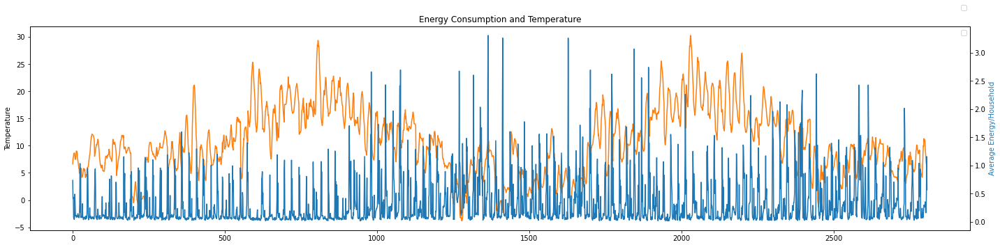

In [304]:
fig, ax1 = plt.subplots(figsize = (20,5))
ax1.plot(weather_energy.index, weather_energy.temperature, color = 'tab:orange')
ax1.set_ylabel('Temperature')
ax1.legend()
ax2 = ax1.twinx()
ax2.plot(weather_energy.index,weather_energy_info.energy,color = 'tab:blue')
ax2.set_ylabel('Average Energy/Household',color = 'tab:blue')
ax2.legend(bbox_to_anchor=(0.0, 1.02, 1.0, 0.102))
plt.title('Energy Consumption and Temperature')
fig.tight_layout()
plt.show()

In [305]:
weather_energy_info.set_index(['datetime'],inplace=True)

In [306]:
weather_energy_info

,tstp,LCLid,date,month,day_of_month,time,weekday,energy,temperature,windBearing,...,daypart,season,lag1,lag2,lag3,lag4,lag5,lag24,lag25,lag26
datetime,,,,,,,,,,,,,,,,,,,,,
2011-12-07 00:00:00,2011-12-07 00:00:00,MAC000246,2011-12-07,12,7,0.0,Wednesday,0.735,6.63,236,...,night,autumn,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2011-12-07 01:00:00,2011-12-07 01:00:00,MAC000246,2011-12-07,12,7,1.0,Wednesday,0.410,7.67,236,...,night,autumn,0.735,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2011-12-07 02:00:00,2011-12-07 02:00:00,MAC000246,2011-12-07,12,7,2.0,Wednesday,0.432,7.76,239,...,night,autumn,0.410,0.735,0.000,0.000,0.000,0.000,0.000,0.000
2011-12-07 03:00:00,2011-12-07 03:00:00,MAC000246,2011-12-07,12,7,3.0,Wednesday,0.077,8.26,244,...,night,autumn,0.432,0.410,0.735,0.000,0.000,0.000,0.000,0.000
2011-12-07 04:00:00,2011-12-07 04:00:00,MAC000246,2011-12-07,12,7,4.0,Wednesday,0.050,8.61,250,...,night,autumn,0.077,0.432,0.410,0.735,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-02-26 19:00:00,2014-02-26 19:00:00,MAC000246,2014-02-26,2,26,19.0,Wednesday,0.157,7.73,215,...,evening,winter,0.269,0.353,0.269,0.260,0.287,0.355,0.059,0.088
2014-02-26 20:00:00,2014-02-26 20:00:00,MAC000246,2014-02-26,2,26,20.0,Wednesday,0.174,7.06,206,...,evening,winter,0.157,0.269,0.353,0.269,0.260,0.190,0.355,0.059
2014-02-26 21:00:00,2014-02-26 21:00:00,MAC000246,2014-02-26,2,26,21.0,Wednesday,0.450,6.58,206,...,evening,winter,0.174,0.157,0.269,0.353,0.269,1.038,0.190,0.355


In [574]:
model_data_x = weather_energy_info[['energy','hour','minute','temperature','Acorn','dewPoint','humidity','pressure','windSpeed','holiday_ind', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26','ld0', 'ld1', 'ld2', 'ld3', 'dayofy_x', 'dayofy_y', 'daypart']]
model_data_y = weather_energy_info[['energy']]
train = model_data_x
test = model_data_x[700:]

<AxesSubplot:xlabel='datetime'>

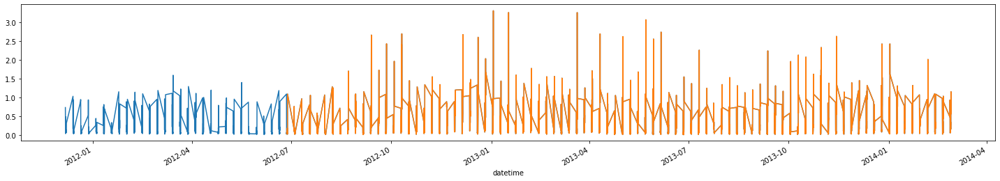

In [308]:
train['energy'].plot(figsize=(25,4))
test['energy'].plot(figsize=(25,4))

In [52]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

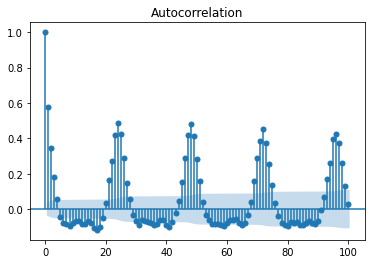

In [53]:
plot_acf(train.energy,lags=100)
plt.show()

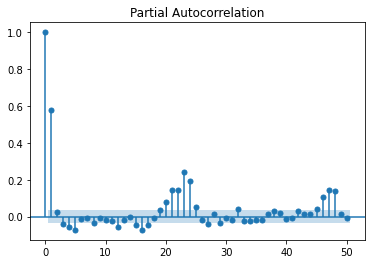

In [54]:
plot_pacf(train.energy,lags=50)
plt.show()

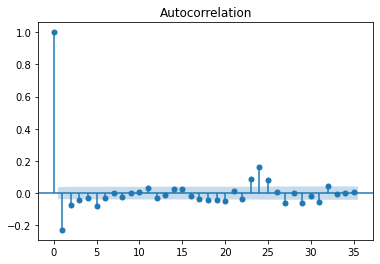

In [55]:
plot_acf(train.energy.diff().dropna())
plt.show()

In [56]:
import statsmodels.api as sm

In [575]:
train.index = pd.DatetimeIndex(train.index).to_period('60M')

In [576]:
train['time'] = train['hour'] + train['minute']/60
test['time'] = test['hour'] + test['minute']/60

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [311]:
train.dtypes
train

,energy,hour,minute,temperature,Acorn,dewPoint,humidity,pressure,windSpeed,holiday_ind,...,lag3,lag4,lag5,lag24,lag25,lag26,dayofy_x,dayofy_y,daypart,time
datetime,,,,,,,,,,,,,,,,,,,,,
2011-12,0.735,0,0,6.63,ACORN-A,4.53,0.86,1005.27,5.49,0,...,0.000,0.000,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,0.0
2011-12,0.410,1,0,7.67,ACORN-A,5.41,0.86,1004.20,5.84,0,...,0.000,0.000,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,1.0
2011-12,0.432,2,0,7.76,ACORN-A,5.46,0.85,1003.06,6.53,0,...,0.000,0.000,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,2.0
2011-12,0.077,3,0,8.26,ACORN-A,5.88,0.85,1002.31,7.16,0,...,0.735,0.000,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,3.0
2011-12,0.050,4,0,8.61,ACORN-A,5.71,0.82,1001.93,7.06,0,...,0.410,0.735,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-02,0.157,19,0,7.73,ACORN-A,2.23,0.68,1016.35,3.85,0,...,0.269,0.260,0.287,0.355,0.059,0.088,0.821477,0.570242,evening,19.0
2014-02,0.174,20,0,7.06,ACORN-A,2.38,0.72,1016.24,3.49,0,...,0.353,0.269,0.260,0.190,0.355,0.059,0.821477,0.570242,evening,20.0
2014-02,0.450,21,0,6.58,ACORN-A,2.75,0.77,1016.02,3.97,0,...,0.269,0.353,0.269,1.038,0.190,0.355,0.821477,0.570242,evening,21.0


In [312]:
t = sm.tsa.adfuller(train.energy, autolag='AIC')
pd.Series(t[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])

Test Statistic                   -5.243275
p-value                           0.000007
#Lags Used                       24.000000
Number of Observations Used    2783.000000
dtype: float64

In [313]:
s = sm.tsa.seasonal_decompose(train.energy,freq=20)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  """Entry point for launching an IPython kernel.


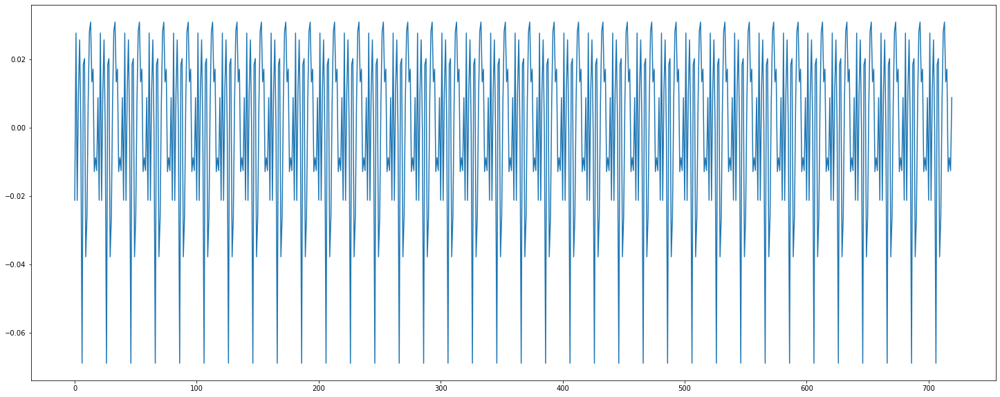

In [314]:

plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[:720], s.seasonal[:720])
#s.seasonal.plot(figsize=(20,5))



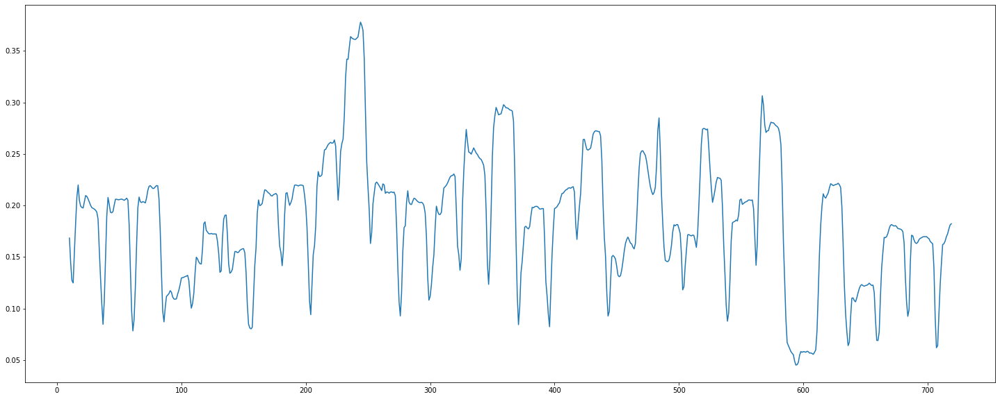

In [315]:

plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[:720], s.trend[:720])



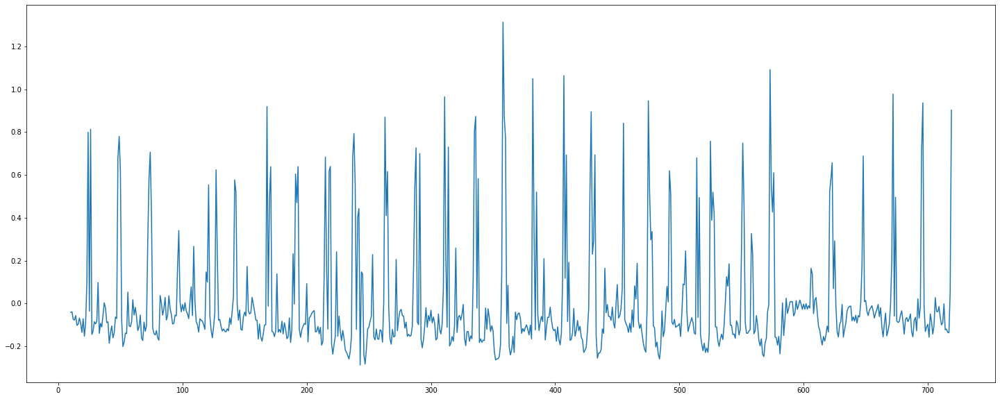

In [316]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[:720], s.resid[:720])
#s.resid.plot(figsize=(20,5))

In [577]:
train['hourofd_x'] = np.sin(train['time']/24*2*math.pi)
train['hourofd_y'] = np.cos(train['time']/24*2*math.pi)
test['hourofd_x'] = np.sin(test['time']/24*2*math.pi)
test['hourofd_y'] = np.cos(test['time']/24*2*math.pi)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

In [318]:
train

,energy,hour,minute,temperature,Acorn,dewPoint,humidity,pressure,windSpeed,holiday_ind,...,lag5,lag24,lag25,lag26,dayofy_x,dayofy_y,daypart,time,hourofd_x,hourofd_y
datetime,,,,,,,,,,,,,,,,,,,,,
2011-12,0.735,0,0,6.63,ACORN-A,4.53,0.86,1005.27,5.49,0,...,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,0.0,0.000000,1.000000
2011-12,0.410,1,0,7.67,ACORN-A,5.41,0.86,1004.20,5.84,0,...,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,1.0,0.258819,0.965926
2011-12,0.432,2,0,7.76,ACORN-A,5.46,0.85,1003.06,6.53,0,...,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,2.0,0.500000,0.866025
2011-12,0.077,3,0,8.26,ACORN-A,5.88,0.85,1002.31,7.16,0,...,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,3.0,0.707107,0.707107
2011-12,0.050,4,0,8.61,ACORN-A,5.71,0.82,1001.93,7.06,0,...,0.000,0.000,0.000,0.000,-0.417194,0.908818,night,4.0,0.866025,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-02,0.157,19,0,7.73,ACORN-A,2.23,0.68,1016.35,3.85,0,...,0.287,0.355,0.059,0.088,0.821477,0.570242,evening,19.0,-0.965926,0.258819
2014-02,0.174,20,0,7.06,ACORN-A,2.38,0.72,1016.24,3.49,0,...,0.260,0.190,0.355,0.059,0.821477,0.570242,evening,20.0,-0.866025,0.500000
2014-02,0.450,21,0,6.58,ACORN-A,2.75,0.77,1016.02,3.97,0,...,0.269,1.038,0.190,0.355,0.821477,0.570242,evening,21.0,-0.707107,0.707107


In [578]:
night_df = train.loc[train['daypart'] == 'night']
evening_df = train.loc[train['daypart'] == 'evening']
afternoon = train.loc[train['daypart'] == 'afternoon']
morning = train.loc[train['daypart'] == 'morning']
noon = train.loc[train['daypart'] == 'noon']

In [579]:
morning.reset_index(inplace = True)
afternoon.reset_index(inplace = True)
evening_df.reset_index(inplace = True)
night_df.reset_index(inplace = True)
noon.reset_index(inplace = True)

In [580]:
morning

,index,energy,hour,minute,temperature,Acorn,dewPoint,humidity,pressure,windSpeed,...,ld0,ld1,ld2,ld3,dayofy_x,dayofy_y,daypart,time,hourofd_x,hourofd_y
0,1970-01,0.074,6,0,8.57,ACORN-A,4.72,0.77,1002.43,7.16,...,0.096,0.089,0.127,0.154,-0.417194,0.908818,morning,6.0,1.000000,6.123234e-17
1,1970-01,0.489,7,0,8.05,ACORN-A,3.64,0.74,1003.09,7.00,...,0.095,0.096,0.089,0.127,-0.417194,0.908818,morning,7.0,0.965926,-2.588190e-01
2,1970-01,0.277,8,0,7.57,ACORN-A,2.54,0.70,1004.29,7.21,...,0.110,0.095,0.096,0.089,-0.417194,0.908818,morning,8.0,0.866025,-5.000000e-01
3,1970-01,0.103,9,0,7.46,ACORN-A,1.61,0.66,1005.31,7.87,...,0.279,0.110,0.095,0.096,-0.417194,0.908818,morning,9.0,0.707107,-7.071068e-01
4,1970-01,0.075,6,0,4.16,ACORN-A,1.63,0.84,991.17,3.46,...,0.061,0.050,0.091,0.055,-0.304921,0.952378,morning,6.0,1.000000,6.123234e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
463,1970-01,0.089,9,0,6.65,ACORN-A,5.14,0.90,1012.28,3.37,...,0.172,0.063,0.139,0.074,0.746972,0.664855,morning,9.0,0.707107,-7.071068e-01
464,1970-01,0.089,6,0,4.88,ACORN-A,2.62,0.85,1010.24,2.89,...,0.031,0.056,0.119,0.127,0.821477,0.570242,morning,6.0,1.000000,6.123234e-17
465,1970-01,0.238,7,0,4.17,ACORN-A,2.63,0.90,1011.09,2.79,...,0.121,0.031,0.056,0.119,0.821477,0.570242,morning,7.0,0.965926,-2.588190e-01
466,1970-01,0.156,8,0,4.92,ACORN-A,3.30,0.89,1012.02,3.25,...,0.091,0.121,0.031,0.056,0.821477,0.570242,morning,8.0,0.866025,-5.000000e-01


#  SARIMAX Model

In [ ]:
'lag1', 'lag2', 'hourofd_x', 'dayofy_x', 'lag24', 'lag26', 'humidity',
       'time', 'lag25', 'dayofy'

In [549]:
endog = train['energy'][:1580]
exog = sm.add_constant(train[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month']][:1580])
model = SARIMAX(endog = endog, exog = exog, order=(3,0,3),seasonal_order=(3,1, 3, 24))
model_fit = model.fit()
print(model_fit.summary())

C:\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                     SARIMAX Results                                      
Dep. Variable:                             energy   No. Observations:                 1580
Model:             SARIMAX(3, 0, 3)x(3, 1, 3, 24)   Log Likelihood                -244.804
Date:                            Mon, 01 Nov 2021   AIC                            531.608
Time:                                    18:00:10   BIC                            643.955
Sample:                                12-31-2011   HQIC                           573.385
                                     - 03-31-2013                                         
Covariance Type:                              opg                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        2.083e-07   4.75e-07      0.438      0.661   -7.23e-07    1.14e-06
temperature    -0.0056      0.00

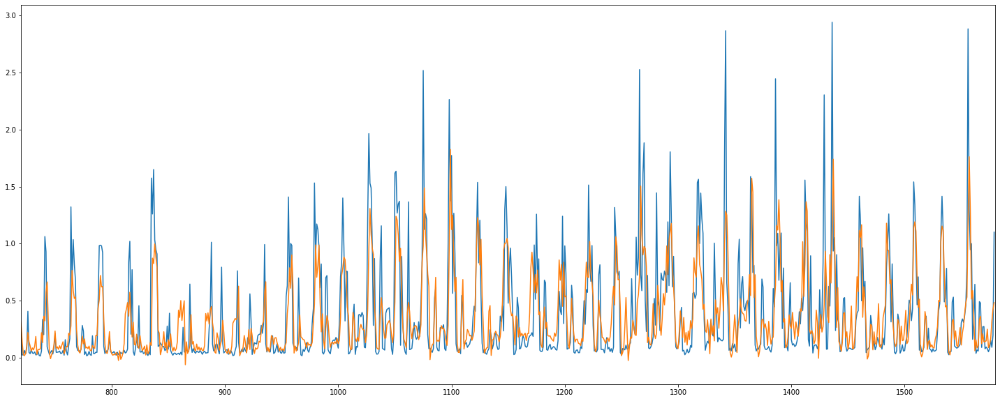

datetime
2011-12    0.125487
2011-12    0.127057
2011-12    0.127697
2011-12    0.132657
2011-12    0.133576
             ...   
2013-03    0.111669
2013-03    0.168600
2013-03    0.317269
2013-03    0.423049
2013-03    0.481662
Freq: 60M, Length: 1580, dtype: float64


In [550]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[:1580], train['energy'][:1580])
plt.plot(weather_energy.index[:1580], model_fit.fittedvalues[:1580])
plt.xlim(weather_energy.index[720], weather_energy.index[1580])
plt.show()
print(model_fit.fittedvalues[:1580])

In [551]:
train_score = mean_squared_error(train['energy'][:1580], model_fit.fittedvalues[:1580])
print('Test MSE: %.3f' % train_score)

Test MSE: 0.079


datetime
2011-12    0.345513
2011-12    0.198943
2011-12    0.002303
2011-12   -0.009657
2011-12   -0.041576
             ...   
2013-03   -0.032669
2013-03   -0.016600
2013-03   -0.227269
2013-03   -0.228049
2013-03    0.618338
Freq: 60M, Length: 1580, dtype: float64


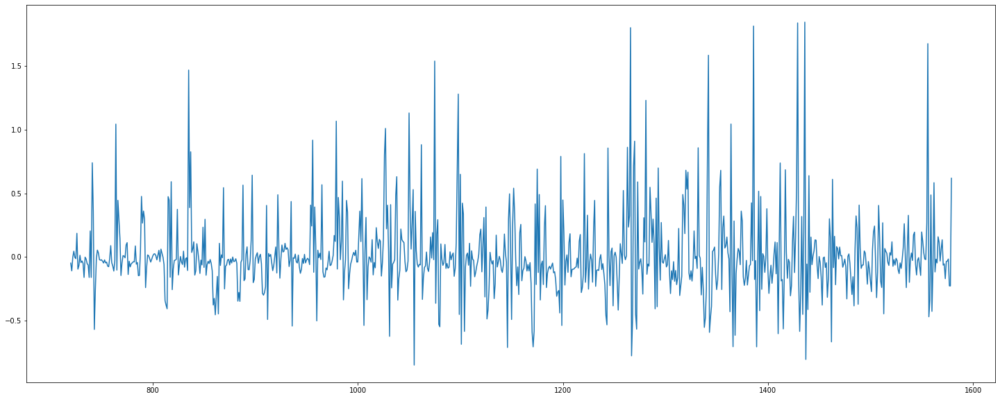

In [552]:
residuals = model_fit.resid
print(residuals)
plt.plot(weather_energy.index[720:1580], residuals[720:1580])

In [553]:
lags_ar = np.zeros(25)
lags_ar[0] = 1
lags_ar[1] = 1
lags_ar[23] = 1
lags_ar[24] = 1
llar = lags_ar.tolist()

In [565]:
model_res = SARIMAX(endog = residuals[:1580], exog = exog, order=(llar,0,llar), mle_regression = True)
model_res_fit = model_res.fit()

C:\anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


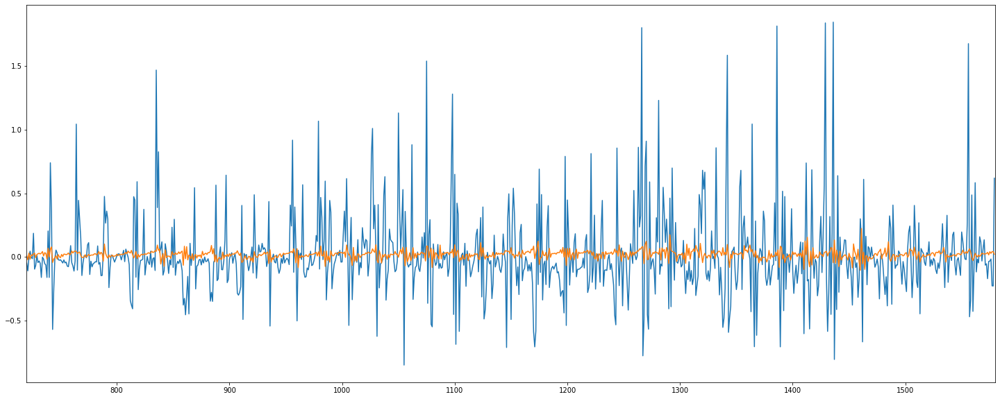

In [566]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[720:1580], residuals[720:1580])
plt.plot(weather_energy.index[720:1580], model_res_fit.fittedvalues[720:1580])
plt.xlim(weather_energy.index[720], weather_energy.index[1580])
plt.show()

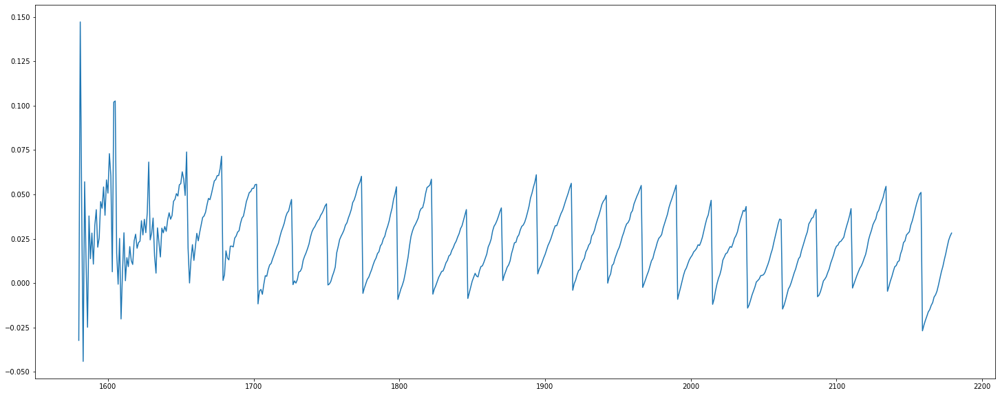

In [584]:
predictions_res = model_res_fit.predict(start=1580, end=2179, dynamic= True, exog = exog1[:600])
plt.plot(weather_energy.index[1580:2180], predictions_res)

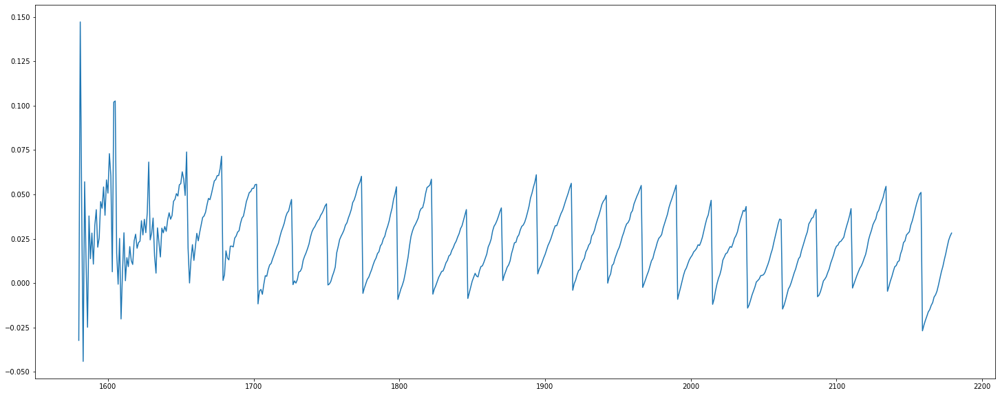

In [568]:
exog1 = sm.add_constant(test[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month']][880:])
forecasted_res = model_res_fit.forecast(600, exog = exog1[:600], alpha=0.05)
plt.plot(weather_energy.index[1580:2180], forecasted_res[:600])

datetime
2012-06-25 05:00:00    0.049
2012-06-25 06:00:00    0.082
2012-06-25 07:00:00    0.178
2012-06-25 08:00:00    0.060
2012-06-25 09:00:00    0.031
                       ...  
2014-02-24 19:00:00    0.098
2014-02-24 20:00:00    1.274
2014-02-24 21:00:00    2.279
2014-02-24 22:00:00    1.363
2014-02-24 23:00:00    0.298
Name: energy, Length: 2103, dtype: float64


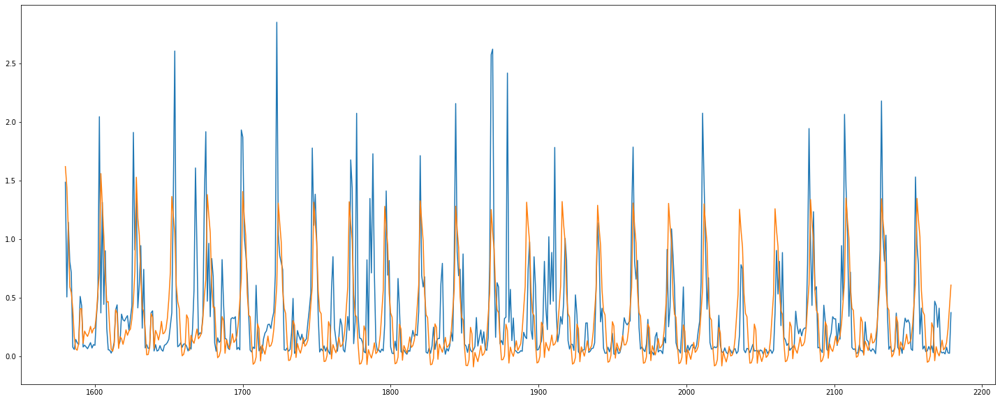

In [572]:
#exog1 = sm.add_constant(test[['temperature','time','humidity','pressure','holiday_ind']])
forecasted = model_fit.forecast(600, exog = exog1[:600], alpha=0.05) + forecasted_res
print(test['energy'])
plt.plot(weather_energy.index[1580:2180], test['energy'][880:1480])
plt.plot(weather_energy.index[1580:2180], forecasted)


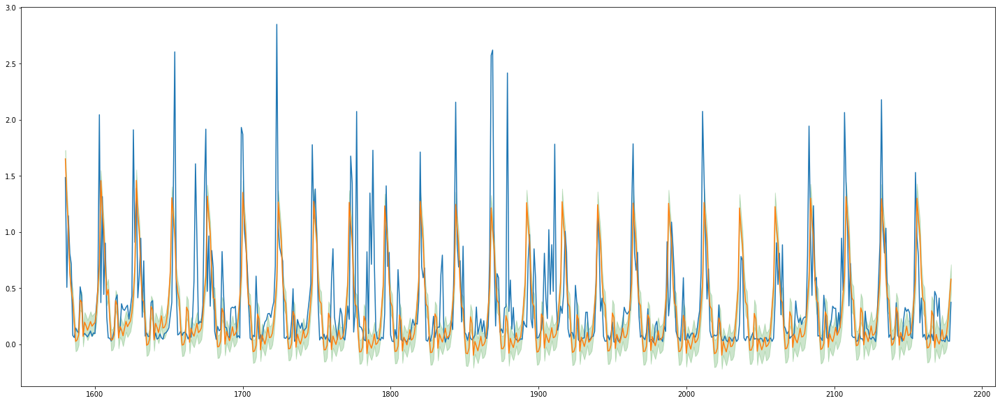

In [578]:
exog2 = sm.add_constant(train[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month']][1580:2180])
prediction = model_fit.get_prediction(start=1580,end=2179,dynamic=False, exog = exog1[:600])
prediction_ci = prediction.conf_int()
plt.plot(weather_energy.index[1580:2180], test['energy'][880:1480])
plt.plot(weather_energy.index[1580:2180], prediction.predicted_mean)
plt.fill_between(weather_energy.index[1580:2180], prediction.predicted_mean + prediction.var_pred_mean, prediction.predicted_mean - prediction.var_pred_mean, color='g', alpha=0.2)

In [582]:
test_score = mean_squared_error(test['energy'][880:1480], forecasted)
test_score1 = mean_squared_error(test['energy'][880:1480], prediction.predicted_mean)
print('Test MSE: %.3f' % test_score)
print('Test MSE: %.3f' % test_score1)

Test MSE: 0.153
Test MSE: 0.155


In [587]:
r2_score(test['energy'][880:1480], forecasted)

0.3015257149539583

# Simple AR (NOT USED)

In [68]:
from statsmodels.tsa.ar_model import AutoReg

In [320]:
lags_ar = np.zeros(25)
lags_ar[0] = 1
lags_ar[1] = 1
lags_ar[23] = 1
lags_ar[24] = 1
llar = lags_ar.tolist()

In [330]:
model_data_x = weather_energy[['energy','hour','minute','temperature','dewPoint','humidity','pressure','windSpeed','holiday_ind', 'month', 'dayofy_x', 'dayofy_y']]
model_data_y = weather_energy[['energy']]
train = model_data_x
test = model_data_x[1580:2180]
train['time'] = train['hour'] + train['minute']/60
test['time'] = test['hour'] + test['minute']/60

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [331]:
train.index.dtype

dtype('int64')

In [332]:
train['hourofd_x'] = np.sin(train['time']/24*2*math.pi)
train['hourofd_y'] = np.cos(train['time']/24*2*math.pi)
test['hourofd_x'] = np.sin(test['time']/24*2*math.pi)
test['hourofd_y'] = np.cos(test['time']/24*2*math.pi)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

In [333]:
train.dtypes

energy         float64
hour             int64
minute           int64
temperature    float64
dewPoint       float64
humidity       float64
pressure       float64
windSpeed      float64
holiday_ind      int32
month            int64
dayofy_x       float64
dayofy_y       float64
time           float64
hourofd_x      float64
hourofd_y      float64
dtype: object

In [334]:
exog2 = sm.add_constant(train[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month',]][:1580])
model = AutoReg(train['energy'][:1580], lags=[1, 2, 24, 25], exog = exog2)
model_fit = model.fit()

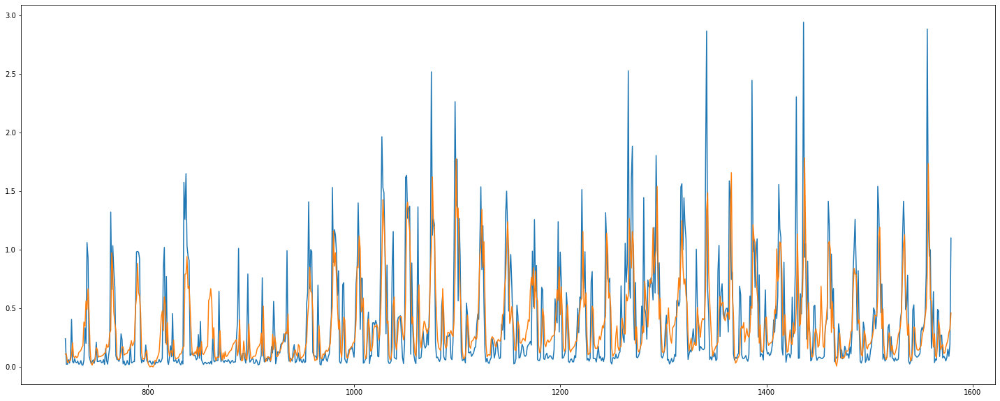

In [335]:
predictions_train = model_fit.predict(start=0, end=1579, dynamic=False, exog_oos = exog2)
plt.plot(weather_energy.index[720:1580], train['energy'][720:1580])
plt.plot(weather_energy.index[720:1580], predictions_train[720:1580])

In [336]:
train_score = mean_squared_error(train['energy'][720:1580], predictions_train[720:1580])
print('Test MSE: %.3f' % train_score)

Test MSE: 0.110


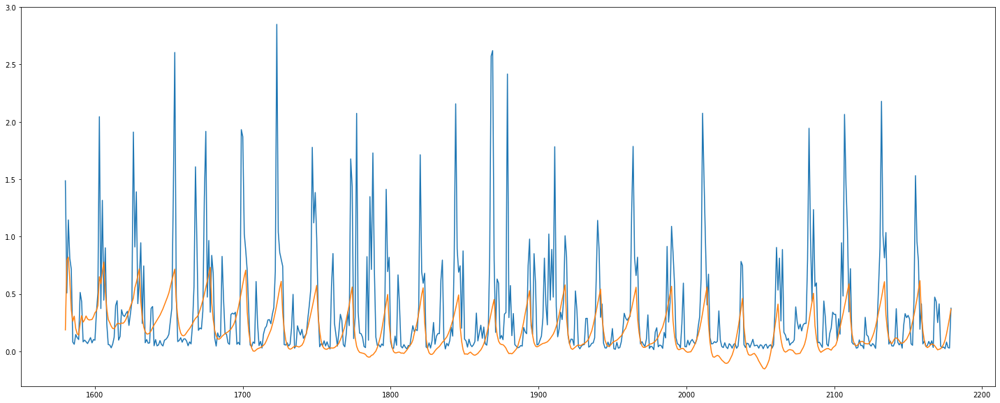

In [339]:
exog3 = sm.add_constant(train[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month']][1580:2180])
predictions = model_fit.predict(start=1580, end=2179, dynamic=True, exog_oos = exog3)
plt.plot(weather_energy.index[1580:2180], test['energy'])
plt.plot(weather_energy.index[1580:2180], predictions)

In [340]:
test_score = mean_squared_error(test['energy'], predictions)
print('Test MSE: %.3f' % test_score)

Test MSE: 0.193


## SVR (NOT FINALIZED)

In [71]:
from sklearn import svm

In [100]:
svr_fit = svm.NuSVR(kernel='rbf', gamma = 0.35, nu = 0.8).fit(morning[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month','lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:300], morning['energy'][:300])
svrscore = svr_fit.score(morning[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][:300], morning['energy'][:300])
print(svrscore)

0.859508213944046


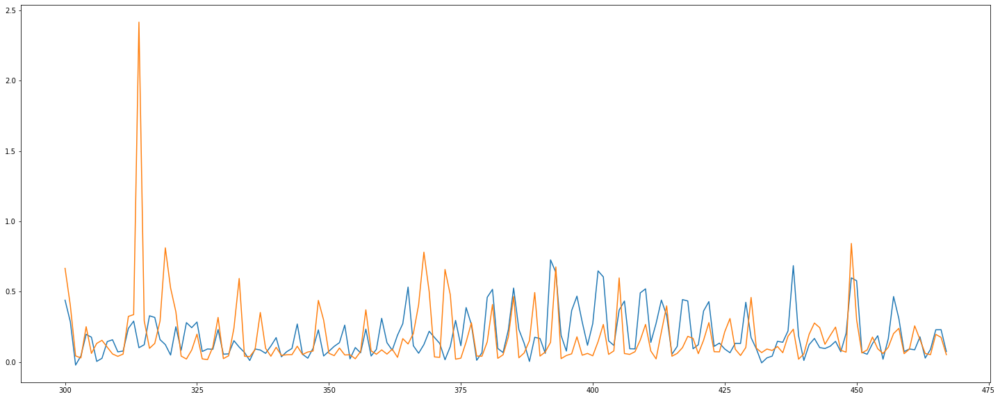

In [101]:
predictions_svr = svr_fit.predict(morning[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][300:])
plt.plot(morning.index[300:], predictions_svr)
plt.plot(morning.index[300:],morning['energy'][300:])

In [102]:
test_score_svr = mean_squared_error(morning['energy'][300:], predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.069


In [471]:
svr_fit = svm.NuSVR(kernel='rbf', gamma = 0.055, nu = 0.9).fit(noon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month','lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:300], noon['energy'][:300])
svrscore = svr_fit.score(noon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][:300], noon['energy'][:300])
print(svrscore)

0.34406355455894533


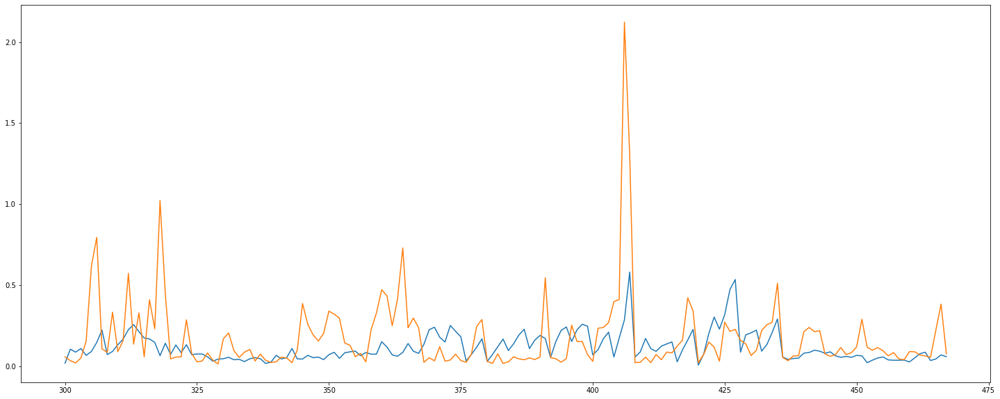

In [472]:
predictions_svr = svr_fit.predict(noon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][300:])
plt.plot(noon.index[300:], predictions_svr)
plt.plot(noon.index[300:],noon['energy'][300:])

In [473]:
test_score_svr = mean_squared_error(noon['energy'][300:], predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.054


In [174]:
svr_fit = svm.NuSVR(kernel='rbf', gamma = 0.025, nu = 0.9).fit(afternoon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind', 'month','lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:300], afternoon['energy'][:300])
svrscore = svr_fit.score(afternoon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][:300], afternoon['energy'][:300])
print(svrscore)

0.38673546266401226


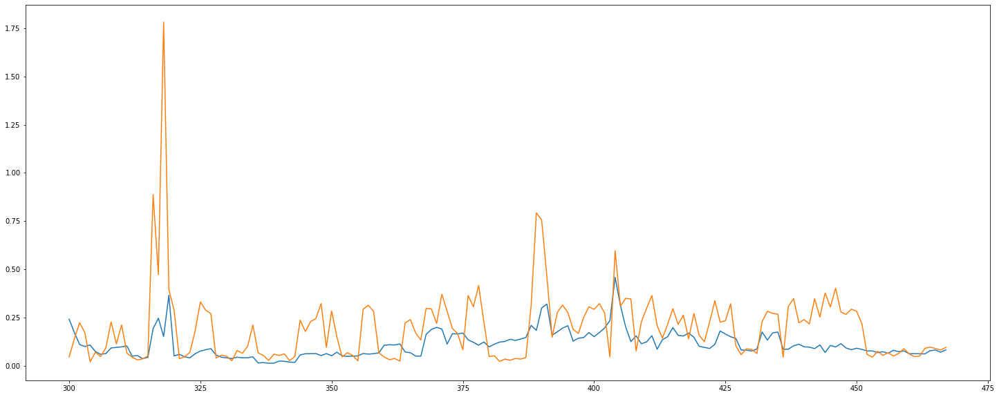

In [175]:
predictions_svr = svr_fit.predict(afternoon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][300:])
plt.plot(afternoon.index[300:], predictions_svr)
plt.plot(afternoon.index[300:],afternoon['energy'][300:])

In [176]:
test_score_svr = mean_squared_error(afternoon['energy'][300:], predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.037


In [206]:
svr_fit = svm.NuSVR(kernel='rbf', gamma = 0.015, nu = 0.4).fit(evening_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month','lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:300], evening_df['energy'][:300])
svrscore = svr_fit.score(evening_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][:300], evening_df['energy'][:300])
print(svrscore)

0.3965592406816818


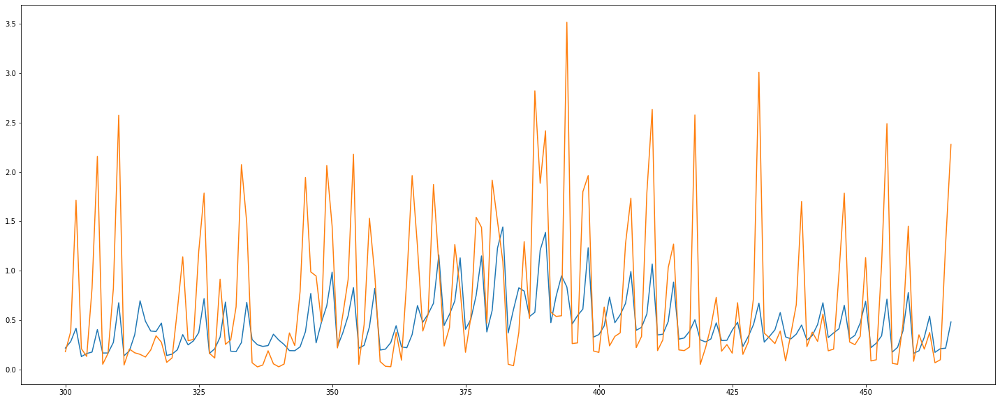

In [207]:
predictions_svr = svr_fit.predict(evening_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][300:])
plt.plot(evening_df.index[300:], predictions_svr)
plt.plot(evening_df.index[300:],evening_df['energy'][300:])

In [208]:
test_score_svr = mean_squared_error(evening_df['energy'][300:], predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.476


In [227]:
svr_fit = svm.NuSVR(kernel='rbf', gamma = 0.015, nu = 0.9).fit(night_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month','lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:700], night_df['energy'][:700])
svrscore = svr_fit.score(night_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][:700], night_df['energy'][:700])
print(svrscore)

0.5534343513028346


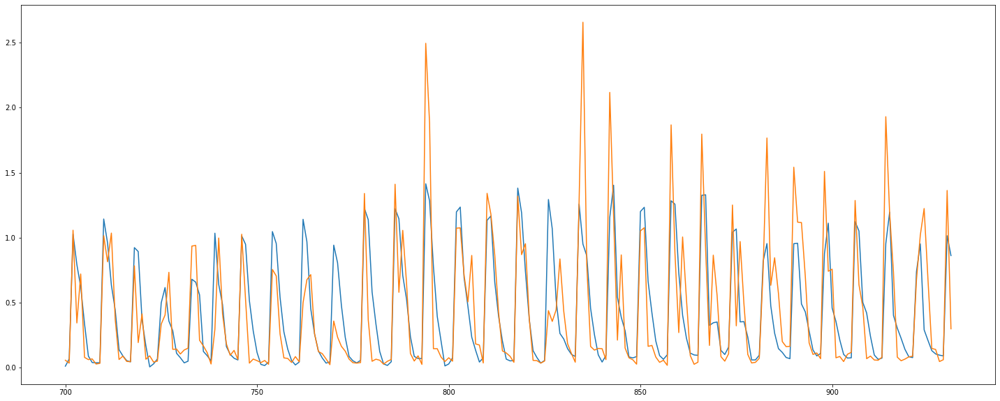

In [228]:
predictions_svr = svr_fit.predict(night_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']][700:])
plt.plot(night_df.index[700:], predictions_svr)
plt.plot(night_df.index[700:],night_df['energy'][700:])

In [229]:
test_score_svr = mean_squared_error(night_df['energy'][700:], predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.102


## GPR

In [329]:
del gpr

In [426]:
kernels_gpr = kernels.RBF(length_scale = 0.1) + kernels.DotProduct(sigma_0 = 1) + kernels.WhiteKernel(noise_level = 0.2)
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(morning[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:300], morning['energy'][:300])
gprscore = gpr.score(morning[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26']][:300], morning['energy'][:300])
print(gprscore)

0.3445352330814242


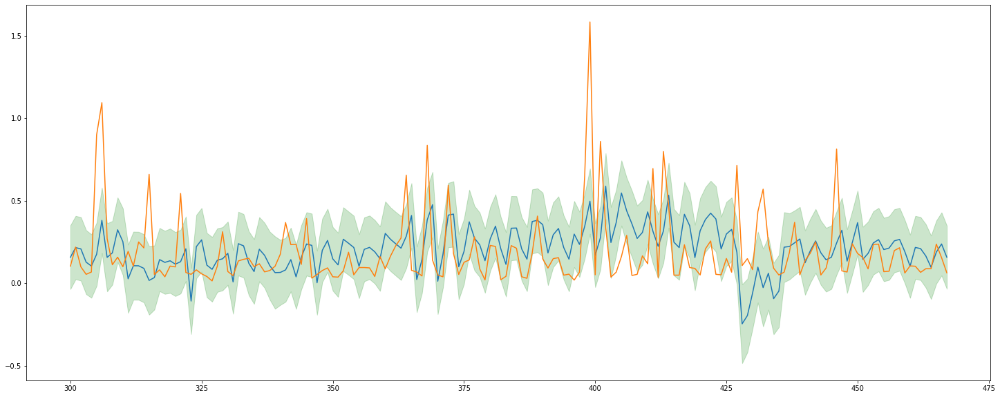

In [427]:
predictions_morning_gpr = gpr.predict(morning[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26']][300:], return_std = True)
plt.plot(morning.index[300:], predictions_morning_gpr[0])
plt.plot(morning.index[300:],morning['energy'][300:])
plt.fill_between(morning.index[300:], predictions_morning_gpr[0] + predictions_morning_gpr[1], predictions_morning_gpr[0] - predictions_morning_gpr[1], color='g', alpha=0.2)

In [428]:
test_score = mean_squared_error(morning['energy'][300:], predictions_morning_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.051


In [429]:
kernels_gpr = kernels.RBF(length_scale = 0.1) + kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.02)
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(noon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:300], noon['energy'][:300])
gprscore = gpr.score(noon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26']][:300], noon['energy'][:300])
print(gprscore)

0.31674640744137705


C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__sigma_0 is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


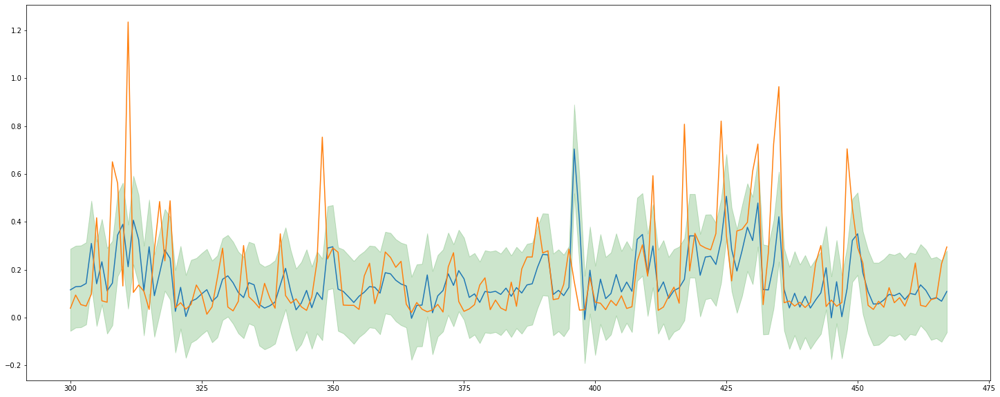

In [430]:
predictions_noon_gpr = gpr.predict(noon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26']][300:], return_std = True)
plt.plot(noon.index[300:], predictions_noon_gpr[0])
plt.plot(noon.index[300:],noon['energy'][300:])
plt.fill_between(noon.index[300:], predictions_noon_gpr[0] + predictions_noon_gpr[1], predictions_noon_gpr[0] - predictions_noon_gpr[1], color='g', alpha=0.2)

In [431]:
test_score = mean_squared_error(noon['energy'][300:], predictions_noon_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.034


In [432]:
kernels_gpr = kernels.RBF(length_scale = 0.11) + kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.02)
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(afternoon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:300], afternoon['energy'][:300])
gprscore = gpr.score(afternoon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5','lag24', 'lag25', 'lag26']][:300], afternoon['energy'][:300])
print(gprscore)

0.8915073300564686


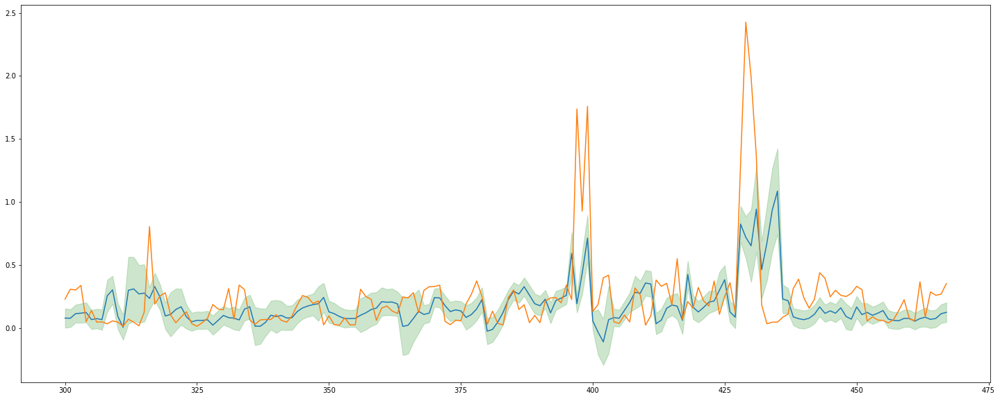

In [433]:
predictions_aft_gpr = gpr.predict(afternoon[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26']][300:], return_std = True)
plt.plot(afternoon.index[300:], predictions_aft_gpr[0])
plt.plot(afternoon.index[300:],afternoon['energy'][300:])
plt.fill_between(afternoon.index[300:], predictions_aft_gpr[0] + predictions_aft_gpr[1], predictions_aft_gpr[0] - predictions_aft_gpr[1], color='g', alpha=0.2)

In [434]:
test_score = mean_squared_error(afternoon['energy'][300:], predictions_aft_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.091


In [435]:
kernels_gpr = kernels.RBF(length_scale = 80) + kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.02)
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(evening_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:300], evening_df['energy'][:300])
gprscore = gpr.score(evening_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5','lag24', 'lag25', 'lag26']][:300], evening_df['energy'][:300])
print(gprscore)

0.5195437485706291


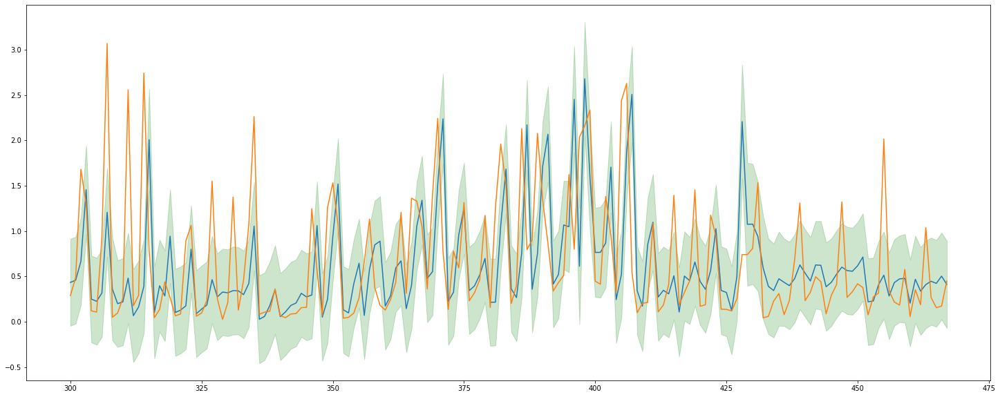

In [436]:
predictions_ev_gpr = gpr.predict(evening_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26']][300:], return_std = True)
plt.plot(evening_df.index[300:], predictions_ev_gpr[0])
plt.plot(evening_df.index[300:],evening_df['energy'][300:])
plt.fill_between(evening_df.index[300:], predictions_ev_gpr[0] + predictions_ev_gpr[1], predictions_ev_gpr[0] - predictions_ev_gpr[1], color='g', alpha=0.2)

In [437]:
test_score = mean_squared_error(evening_df['energy'][300:], predictions_ev_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.398


In [438]:
kernels_gpr = kernels.RBF(length_scale = 1.51) + kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.02)
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(night_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26' ]][:700], night_df['energy'][:700])
gprscore = gpr.score(night_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26']][:700], night_df['energy'][:700])
print(gprscore)

0.5173375471384392


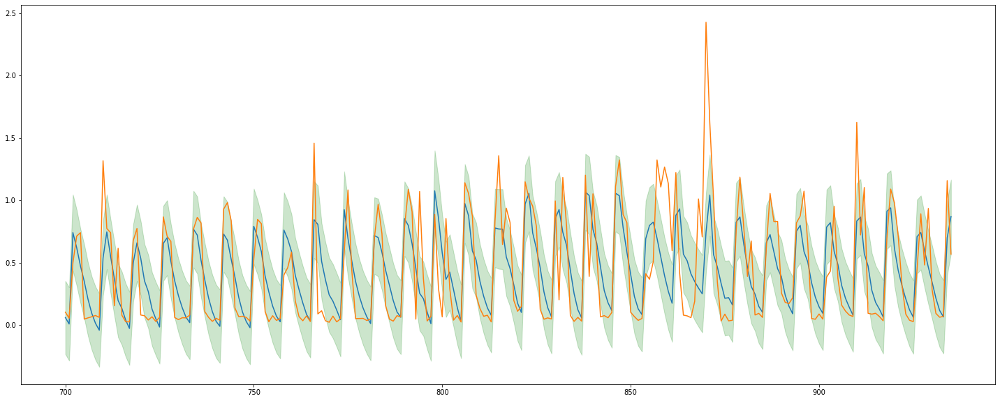

In [439]:
predictions_night_gpr = gpr.predict(night_df[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4', 'lag5', 'lag24', 'lag25', 'lag26']][700:], return_std = True)
plt.plot(night_df.index[700:], predictions_night_gpr[0])
plt.plot(night_df.index[700:],night_df['energy'][700:])
plt.fill_between(night_df.index[700:], predictions_night_gpr[0] + predictions_night_gpr[1], predictions_night_gpr[0] - predictions_night_gpr[1], color='g', alpha=0.2)

In [440]:
test_score = mean_squared_error(night_df['energy'][700:], predictions_night_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.091


## Model Combination

In [441]:
morning_idx['predict'] = np.nan
morning_idx['predict'][:300] = morning['energy'][:300]
morning_idx['predict'][300:] = predictions_morning_gpr[0]
noon_idx['predict'] = np.nan
noon_idx['predict'][:300] = noon['energy'][:300]
noon_idx['predict'][300:] = predictions_noon_gpr[0]
afternoon_idx['predict'] = np.nan
afternoon_idx['predict'][:300] = afternoon['energy'][:300]
afternoon_idx['predict'][300:] = predictions_aft_gpr[0]
evening_idx['predict'] = np.nan
evening_idx['predict'][:300] = evening_df['energy'][:300]
evening_idx['predict'][300:] = predictions_ev_gpr[0]
night_idx['predict'] = np.nan
night_idx['predict'][:700] = night_df['energy'][:700]
night_idx['predict'][700:] = predictions_night_gpr[0]

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\anaconda3\lib\site-packages\ipykernel_launche

In [442]:
merged_periods = morning_idx.copy()
merged_periods = merged_periods.append(noon_idx, ignore_index=True, sort=False)
merged_periods = merged_periods.append(afternoon_idx, ignore_index=True, sort=False)
merged_periods = merged_periods.append(evening_idx, ignore_index=True, sort=False)
merged_periods = merged_periods.append(night_idx, ignore_index=True, sort=False)

In [443]:
np.where(merged_periods['predict'].isna())

(array([], dtype=int64),)

In [444]:
weather_energy['index'] = weather_energy.index

In [445]:
weather_energy

,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,temperature,...,apparentTemperature,hour,minute,Bank holidays,Type,holiday_ind,dayofy,dayofy_x,dayofy_y,index
0,2011-12-07 00:00:00,MAC000246,2011-12-07 00:00:00,2011-12-07,12,7,00:00:00,2,0.735,6.63,...,3.17,0,0,NaN,NaN,0,340.0,-0.417194,0.908818,0
1,2011-12-07 01:00:00,MAC000246,2011-12-07 01:00:00,2011-12-07,12,7,01:00:00,2,0.410,7.67,...,4.33,1,0,NaN,NaN,0,340.0,-0.417194,0.908818,1
2,2011-12-07 02:00:00,MAC000246,2011-12-07 02:00:00,2011-12-07,12,7,02:00:00,2,0.432,7.76,...,4.21,2,0,NaN,NaN,0,340.0,-0.417194,0.908818,2
3,2011-12-07 03:00:00,MAC000246,2011-12-07 03:00:00,2011-12-07,12,7,03:00:00,2,0.077,8.26,...,4.66,3,0,NaN,NaN,0,340.0,-0.417194,0.908818,3
4,2011-12-07 04:00:00,MAC000246,2011-12-07 04:00:00,2011-12-07,12,7,04:00:00,2,0.050,8.61,...,5.14,4,0,NaN,NaN,0,340.0,-0.417194,0.908818,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,2014-02-26 19:00:00,MAC000246,2014-02-26 19:00:00,2014-02-26,2,26,19:00:00,2,0.157,7.73,...,5.29,19,0,NaN,NaN,0,56.0,0.821477,0.570242,2803
2804,2014-02-26 20:00:00,MAC000246,2014-02-26 20:00:00,2014-02-26,2,26,20:00:00,2,0.174,7.06,...,4.67,20,0,NaN,NaN,0,56.0,0.821477,0.570242,2804
2805,2014-02-26 21:00:00,MAC000246,2014-02-26 21:00:00,2014-02-26,2,26,21:00:00,2,0.450,6.58,...,3.82,21,0,NaN,NaN,0,56.0,0.821477,0.570242,2805
2806,2014-02-26 22:00:00,MAC000246,2014-02-26 22:00:00,2014-02-26,2,26,22:00:00,2,1.158,6.24,...,3.53,22,0,NaN,NaN,0,56.0,0.821477,0.570242,2806


In [446]:
weather_energy_predict =  weather_energy.merge(merged_periods[['index','predict']],how='left',on='index')

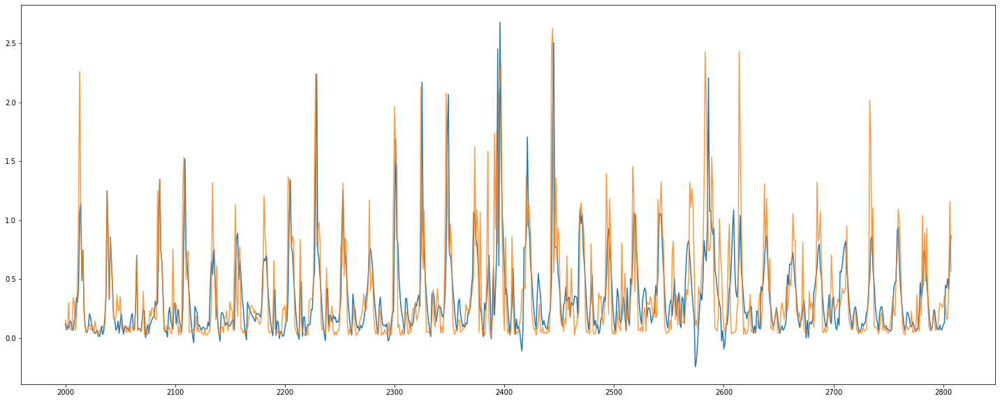

In [447]:
plt.plot(weather_energy_predict.index[2000:], weather_energy_predict.predict[2000:])
plt.plot(weather_energy_predict.index[2000:],weather_energy['energy'][2000:], alpha = 0.8)

In [448]:
test_score = mean_squared_error(weather_energy['energy'][2000:], weather_energy_predict.predict[2000:])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.115


In [449]:
r2_score(weather_energy['energy'][2000:],  weather_energy_predict.predict[2000:])

0.40672873551099287

## Normal GPR for comparison

In [581]:
train = pd.get_dummies(data=train, columns=['daypart'])

In [582]:
test = pd.get_dummies(data=test, columns=['daypart'])

In [583]:
test

,energy,hour,minute,temperature,Acorn,dewPoint,humidity,pressure,windSpeed,holiday_ind,...,dayofy_x,dayofy_y,time,hourofd_x,hourofd_y,daypart_afternoon,daypart_evening,daypart_morning,daypart_night,daypart_noon
700,0.050,4,0,17.63,ACORN-A,16.01,0.90,1018.85,3.77,0,...,0.077386,-0.997001,4.0,0.866025,5.000000e-01,0,0,0,1,0
701,0.038,5,0,17.62,ACORN-A,15.96,0.90,1018.79,3.48,0,...,0.077386,-0.997001,5.0,0.965926,2.588190e-01,0,0,0,1,0
702,0.095,6,0,18.04,ACORN-A,15.89,0.87,1018.59,3.55,0,...,0.077386,-0.997001,6.0,1.000000,6.123234e-17,0,0,1,0,0
703,0.090,7,0,18.71,ACORN-A,15.94,0.84,1018.72,4.10,0,...,0.077386,-0.997001,7.0,0.965926,-2.588190e-01,0,0,1,0,0
704,0.045,8,0,19.20,ACORN-A,15.61,0.80,1018.76,4.38,0,...,0.077386,-0.997001,8.0,0.866025,-5.000000e-01,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,0.157,19,0,7.73,ACORN-A,2.23,0.68,1016.35,3.85,0,...,0.821477,0.570242,19.0,-0.965926,2.588190e-01,0,1,0,0,0
2804,0.174,20,0,7.06,ACORN-A,2.38,0.72,1016.24,3.49,0,...,0.821477,0.570242,20.0,-0.866025,5.000000e-01,0,1,0,0,0
2805,0.450,21,0,6.58,ACORN-A,2.75,0.77,1016.02,3.97,0,...,0.821477,0.570242,21.0,-0.707107,7.071068e-01,0,1,0,0,0
2806,1.158,22,0,6.24,ACORN-A,3.11,0.80,1015.85,3.74,0,...,0.821477,0.570242,22.0,-0.500000,8.660254e-01,0,0,0,1,0


In [608]:
kernels_gpr = kernels.RBF(length_scale = 0.51) * kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.2)
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(train[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4','lag5', 'lag24', 'lag25', 'lag26','ld0', 'ld1', 'ld2', 'ld3', 'daypart_afternoon','daypart_evening','daypart_morning','daypart_night','daypart_noon' ]][:2000], train['energy'][:2000])
gprscore = gpr.score(train[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4','lag5', 'lag24', 'lag25', 'lag26','ld0', 'ld1', 'ld2', 'ld3', 'daypart_afternoon','daypart_evening','daypart_morning','daypart_night','daypart_noon' ]][:2000], train['energy'][:2000])
print(gprscore)

0.5845733946824085


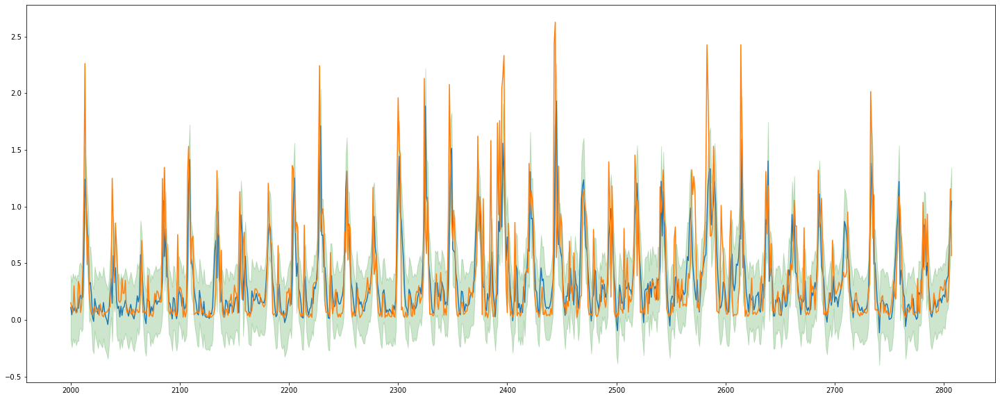

In [609]:
predictions_gpr = gpr.predict(train[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month', 'lag1', 'lag2', 'lag3','lag4','lag5', 'lag24', 'lag25', 'lag26','ld0', 'ld1', 'ld2', 'ld3', 'daypart_afternoon','daypart_evening','daypart_morning','daypart_night','daypart_noon' ]][2000:], return_std = True)
plt.plot(weather_energy.index[2000:], predictions_gpr[0])
plt.plot(weather_energy.index[2000:],train['energy'][2000:])
plt.fill_between(weather_energy.index[2000:], predictions_gpr[0] + predictions_gpr[1], predictions_gpr[0] - predictions_gpr[1], color='g', alpha=0.2)

In [610]:
test_score = mean_squared_error(weather_energy['energy'][2000:], predictions_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.097


In [611]:
r2_score(weather_energy['energy'][2000:], predictions_gpr[0])

0.5006312273494491

In [ ]:
# TO DO!!!
# 1) CLEAN THE CODE
# 2) CUT OUTLIERS AND SEE THE PERFORMANCE